<footer id="footer"></footer>

<h1 align='center'>Image captioning / Автоматическое описание изображений</h1>
<p align="center"><img src="https://drive.google.com/uc?id=13kkf3KqoYRRsnqJA94lDK_ykiop35bED"  border="0"></a></p>




## Описание


`Image captioning` — это процесс создания текстового описания для заданных изображений. Это была важная и фундаментальная задача в области глубокого обучения. Подписи к изображениям имеют огромное количество применений - например, подготовка приложений для слабовидящих людей. То есть идея состоит в том, что мы подаем изображение, а в ответ получаем некоторый текст

`Image captioning` можно рассматривать как проблему `Sequence to Sequence`, поскольку она преобразует изображения, которые рассматриваются как последовательность пикселей, в последовательность слов. Для этого нам нужно обработать как язык или утверждения, так и изображения. Для языковой части мы используем рекуррентные нейронные сети, а для части изображения мы используем сверточные нейронные сети для получения векторов признаков соответственно.


<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


Здесь сохранены все веса и сеты, полученные в результате работы, если возникнет необходимость загрузки:

https://drive.google.com/drive/folders/1KXLDoFR5ZiOkSm5zo6lr5UFSV_lxPH2H?usp=sharing

Также ссылки есть по ходу работы - это мастер ссылка - для всех выходов

Полезные ссылки и материал, которые использованы в процессе исследования:

https://towardsdatascience.com/a-guide-to-image-captioning-e9fd5517f350  
https://towardsdatascience.com/image-captioning-in-deep-learning-9cd23fb4d8d2  
https://www.hindawi.com/journals/cin/2020/3062706/  
https://www.tensorflow.org/tutorials/text/image_captioning  
http://cs.stanford.edu/people/karpathy/deepimagesent/caption_datasets.zip  
https://towardsdatascience.com/image-captions-with-attention-in-tensorflow-step-by-step-927dad3569fa  
https://arxiv.org/pdf/2110.11773.pdf
https://www.youtube.com/watch?v=AHt6KLqWilI  
https://keras.io/examples/vision/image_captioning/    
https://www.kaggle.com/code/hsankesara/image-captioning/notebook  
https://www.kaggle.com/code/shadabhussain/automated-image-captioning-flickr8  
https://www.kaggle.com/code/kagglethomas88/flickr-image-captioning-tpu-tf2-glove-extended/notebook  
https://www.dlschool.org/  
https://blade6570.github.io/soumyatripathy/hdf5_blog.html  
https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb  
https://arxiv.org/abs/1606.02960 
https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Image-Captioning  
https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/text/image_captioning.ipynb 
https://github.com/yurayli/image-caption-pytorch/blob/master/model.py  
https://towardsdatascience.com/foundations-of-nlp-explained-visually-beam-search-how-it-works-1586b9849a24  
https://medium.com/@kion.kim/lstm-vs-lstmcell-and-others-on-gluon-aac33f7b54ea#:~:text=LSTMCell%20is%20useful%20when%20we,at%20the%20previous%20time%20step.&text=Due%20to%20this%20difference%2C%20LSTM,for%20information%20about%20time%20step.



<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


Работа содержит два раздела - свободный `Раздел I` и отработка базового ноутбука - `Раздел II`. Для того, чтобы не возникало путаницы - выполнено как самостоятельные - со своими импортам, методами и функциями, что придаст им некоторую независимость и возможность работать отдельно с каждым

# Раздел I

Первый раздел посвящен работе с датасетом, подготовкой изображений для обучения, обучению энкодера и декодера, работа с `attention`, а также визуализация `attention`

План работы:  

1. Скачаем датасет и аннотации `MSCOCO'2014`

Мы будем использовать тренировочные, проверочные и тестовые сплиты [Андрея Карпати](#https://www.kaggle.com/datasets/shtvkumar/karpathy-splits) вместе с датасетом `MSCOCO'2014`. Но нам будет необходимо сделать предобработку: добавить паддинги <SOS> и <EOS>, чтобы обозначать начало и конец последовательности. Реализуем свой `datapipeline` для предобработки аннотаций и изображения - на выходе получим несколько методом и классов для работы с данной задачей. Также мы будем использовать библиотеку `h5py`, чтобы подготовить наши данные и грузить их уже с диска, это позволит вместить такой датасет на нашем устройстве

2. Реализуем архитектуру `encoder` - `decoder`. 

Так как мы работаем с изображениями - в качестве энкодера мы будем использовать сверточную нейронную сеть, предобученную на `ImageNet` и сделаем ее `finetuning`. УБираем классификационный слой и получаем векторное представление для наших изображений: `Inception`, `ResNet` или можно взять - `EfficientNet`. В качестве декодера мы будем использовать `RNN` - возьмем `LSTM` - нам необходимо на основании векторых представлений слов генерировать текстовое описание слово за словом

3. Реализуем `Attention`

Для того, чтобы нашей сети было легче сконцентрироваться на важных пикселях - мы можем сделать `soft-attention` и выдавать пикселям вес от 0 до 1

4. Реализуем `beam search`

Для того, чтобы не сводить нашу задачу к жадному поиску слов с наивысшим скором - мы внедрим `beam_search` и будем отбирать `k`-кандидатов, на инференсе







### 1. Импорты

Здесь для удобства оберем все импорты. В дальнейшем, для удобства ознакомления с работой - новые методы и классы будут появляться в своих разделах. Здесь представлена только базовая `CNN`

In [ ]:
# версию пришлось зафиксировать
# в новом релизе сломались веса у энкодера 11 июля 
# обучалось до 11, иначе не загрузить веса
!pip install timm==0.5.4 

In [ ]:
import json
import timm
import torch
import random
import h5py
import io
import os
import warnings
import ipywidgets as widgets
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch.nn as nn
from pathlib import Path
from PIL import Image
from torch.utils.data import (
    Dataset,
    DataLoader
)
import torchvision.transforms as transforms
from skimage.transform import (
    resize,
    pyramid_expand
)
from glob import glob
from IPython.display import clear_output, display
from tqdm.autonotebook import tqdm
from torch.nn.utils.rnn import pack_padded_sequence
from collections import Counter
from google.colab import drive, files
import torch.nn.functional as F
from nltk.translate.bleu_score import corpus_bleu
import matplotlib.cm as cm
import shutil
# технические
SEED = random.seed(42)
warnings.filterwarnings("ignore")
plt.style.use('dark_background')

Данная ячейка служит для загрузки сырых данных. Запускать при необходимости. Данные в последствии будут предобработаны и сохранены отдельно для подгрузки в модель

Прицепим диск

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/Diploma_spring/train2014.zip" -d "/content/data" # в одну папку с val
!unzip "/content/drive/MyDrive/Diploma_spring/val2014.zip" -d "/content/data" # в одну папку с train
# json Андрея Карпати для сопоставления аннотаций и изображений.
# на базе этого файла сделаем наши датасеты в h5py
!unzip "/content/drive/MyDrive/Diploma_spring/caption_datasets.zip" -d "/content/caption_dataset_COCO"

Подготовим сразу энкодер на базе `efficientnet_b0`, обученный на `ImageNet`, учить весь не будем - поэтому заморозим первые 5 блоков - оставим только первый. Также необходимо убрать слой классификации и заменить `pooling` слой таким образом, чтобы мы получали некоторое представление нашего изображения, в данном случае - изображение размером `14x14` с `1280` каналами

In [ ]:
class UnNormalize:
    """денормализация изображения для просмотра батчей"""
    def __init__(self, mean: Tuple[float], std: Tuple[float]):
        self.mean = mean
        self.std = std

    def __call__(self, tensor: torch.tensor) -> torch.tensor:
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor

In [ ]:
def findexact(lst):
    """дя удаления PAD и EOS"""
    key = [11568]
    for idx, elem in enumerate(lst):
        if any(item == elem for item in key):
            return idx

In [ ]:
class EffNet(nn.Module):
    """Encoder на базе efficientnetb0 с заморозкой первых 5 блоков
       Классификационный слой заменен на Identity, pooling на AdaptiveAvgPool2d
    """
    def __init__(self,
                 model_name="efficientnet_b0",
                 blocks_to_retrain=1,
                 frozen=True,
                 encoded_size=14):
        super().__init__()
        # замораживаем или нет
        self.frozen = frozen
        # слои для разморощки
        self.UNFREEZE = ['conv_head', 'act2', 'global_pool', 'classifier']
        # грузим предобученную модель и замораживаем первые блоки
        self.model = self.load_model(model_name, blocks_to_retrain)
        self.model.global_pool = nn.AdaptiveAvgPool2d(
            (encoded_size, encoded_size))
        # классификатор меняем на Identity-слой
        self.model.classifier = nn.Identity()

    # прогоняем изображение и получаем закодированное изображение
    # B x encoded_size x encoded_size x 1280
    def forward(self, x):
        x = self.model(x)
        return x.permute(0, 2, 3, 1)

    # учим только последний блок
    def load_model(self, model_name, blocks_to_retrain):
        count = 0
        # модель грузим из timm-библиотеки
        model = timm.create_model(model_name, pretrained=True)
        # если замораживаем блоки
        if self.frozen:
            for name, block in model.blocks.named_children():
                if count >= (len(model.blocks) - blocks_to_retrain):
                    print(f'Unfreeze block {name}')
                    for pname, params in block.named_parameters():
                        if 'bn' not in pname:
                            params.requires_grad = True
                else:
                    print(f'Keep block {name} frozen')
                count += 1
            for name, child in model.named_children():
                if name in self.UNFREEZE:
                    print(f'Unfreeze block {name}')
                    for params in child.parameters():
                        params.requires_grad == True

        return model

Проверим, все ли работает как задумано - инициализируем модель и прогоним через нее `dummy`-тензор. Выдать нам должна аутпут размерностью `1x14x14x1280`

In [ ]:
model = EffNet()
# dummy-image
dummy = torch.randn(1, 3, 224, 224)
model.eval()
with torch.no_grad():
    out = model(dummy)

assert out.numpy().shape == (1, 14, 14, 1280), "выходы CNN не соответствуют задуманным"
print("\nТест успешен ... Можно приступать к дальнейшим подготовкам")

Keep block 0 frozen
Keep block 1 frozen
Keep block 2 frozen
Keep block 3 frozen
Keep block 4 frozen
Keep block 5 frozen
Unfreeze block 6
Unfreeze block conv_head
Unfreeze block act2
Unfreeze block global_pool
Unfreeze block classifier

Тест успешен ... Можно приступать к дальнейшим подготовкам


Отлично, `CNN` у нас готова - нам необходимо подготовить данные, затем написать наш `decoder` на базе `LSTM` с аттеншн и мы сможем приступать к первому этапу обучения

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### 2. Подготовка данных

Посмотрим, с чем вообще мы работаем

In [ ]:
caption_datasets = "/content/caption_dataset_COCO/dataset_coco.json"
with open(caption_datasets, 'r') as j:
    data = json.load(j)

Посмотрим `json`

In [ ]:
data.keys()

dict_keys(['images', 'dataset'])

В файлах Андрея содержалась информация также для `flikr`-сета, мы работаем только с `COCO` - нас интересут, что содержится в ключах `images` 

In [ ]:
data["images"][0].keys()

dict_keys(['filepath', 'sentids', 'filename', 'imgid', 'split', 'sentences', 'cocoid'])

В файле уже содержится информация о изображении, его id, и мы видим, что есть информация о тексте, уже токенизирована

In [ ]:
data["images"][0]["sentences"][0]

{'imgid': 0,
 'raw': 'A man with a red helmet on a small moped on a dirt road. ',
 'sentid': 770337,
 'tokens': ['a',
  'man',
  'with',
  'a',
  'red',
  'helmet',
  'on',
  'a',
  'small',
  'moped',
  'on',
  'a',
  'dirt',
  'road']}

Посмотрим, что у нас собирается из данных - должны получить изображения и текстовое описание того, что на нем происходит

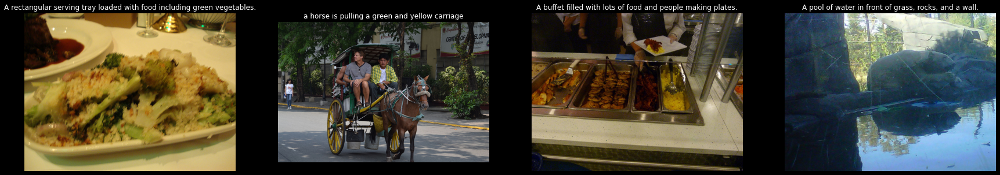

In [ ]:
# берем рандомные образцы из сета

SHOW = 4
rows, cols = 1, SHOW
plt.figure(figsize=(30,30))
for idx in range(SHOW):

  plt.subplot(rows, cols, idx+1)
  ridx = np.random.randint(len(data["images"]))
  sample = data["images"][ridx]
  # смотрим, с чем работаем
  path = Path("/content/data", sample["filepath"], sample["filename"])
  img = Image.open(path)
  raw = sample["sentences"][0]["raw"]
  plt.title(f"{raw}")
  plt.imshow(img)
  plt.axis("off")
plt.show()

Как видим, с аннотациями все в порядке - есть изображение и есть к нему описание. 

Нам необходимо подготовить наши текстовые описания и в целом - подготовить `dataset`, который с помощью загрузчиков будут подаваться при обучении в наши нейронные сети. Из-за ограничений, на данном этапе данные подгружаются с моего диска, затем мы их перезапишем в h5 файлы, чтобы можно было в дальнейшем скачивать и работать с ними, уже предобработанными. Мы используем файлы [`HDF5`](#https://realpython.com/storing-images-in-python/#reading-many-images) для изображений, потому что мы будем считывать их непосредственно с диска во время обучения, чтобы уложиться в лимиты `Collab`

In [ ]:
def convert(img, target_type_min, target_type_max, target_type):
    """приводим к uint8 для сохранения h5py размер 224 на 224"""
    imin = img.min()
    imax = img.max()
    a = (target_type_max - target_type_min) / (imax - imin)
    b = target_type_max - a * imax
    new_img = (a * img + b).astype(target_type)
    return new_img.astype(np.uint8)

In [ ]:
def create_files(dataset: str,
                 caption_datasets: json,
                 folder_with_images: Path,
                 captions_img: int,
                 min_freq: int,
                 output: Path,
                 max_len: int = 75) -> json:
    """функция для сбора hd5-датасета и word2idx-json файла"""

    SIZE = 224
    CHANNELS = 3

    # открываем json, который был подготовлен Андреем Карпати
    with open(caption_datasets, 'r') as j:
        data = json.load(j)
    # читаем пути изображений и описания для них
    train_image_paths = []
    train_image_captions = []
    val_image_paths = []
    val_image_captions = []
    test_image_paths = []
    test_image_captions = []
    # частота слов - ее собираем и сохраним в отдельный файл
    word_freq = Counter()
    for img in data['images']:
        captions = []
        for cap in img['sentences']:
            word_freq.update(cap['tokens'])
            if len(cap['tokens']) <= max_len:
                captions.append(cap['tokens'])
        if len(captions) == 0:
            continue
        # формируем пути для наших изображений. Датасет находится в папке data
        path = Path(folder_with_images, img['filepath'], img['filename'])
        if img['split'] in {'train'}:
            train_image_paths.append(str(path))
            train_image_captions.append(captions)
        elif img['split'] in {'val'}:
            val_image_paths.append(str(path))
            val_image_captions.append(captions)
        elif img['split'] in {'test'}:
            test_image_paths.append(str(path))
            test_image_captions.append(captions)

    # проверка, чтобы количество изображения была равна количество описаний
    assert len(train_image_paths) == len(
        train_image_captions), "проблемы в обучающей выборке"
    assert len(val_image_paths) == len(
        val_image_captions), "проблемы в валидационной выборке"
    assert len(test_image_paths) == len(
        test_image_captions), "проблемы в тестовой выборке"

    # создаем базу слов
    words = [w for w in word_freq.keys() if word_freq[w] > min_freq]
    word_map = {k: v + 1 for v, k in enumerate(words)}
    word_map['<UNK>'] = len(word_map) + 1
    word_map['<SOS>'] = len(word_map) + 1
    word_map['<EOS>'] = len(word_map) + 1
    word_map['<PAD>'] = 0

    # теперь соберем все вместе - это поможет сохранить файлы и подгружать все в дальнейшем без
    # какой либо обработки, в противном случае - нам пришлось бы постоянно подгружать COCO датасет
    out_filename = dataset + '_' + \
        str(captions_img) + '_caps' + str(min_freq) + '_wfreq'
    with open(os.path.join(output, 'wordmap_' + out_filename + '.json'), 'w') as j:
        json.dump(word_map, j)

    # теперь для каждого изображения соберем по captions_img описанию и сохраним в h5-файл
    # из которого в дальнейшем будем осуществлять подгрузку данных
    for ims, caps, splits in [(train_image_paths, train_image_captions, 'train'),
                              (val_image_paths, val_image_captions, 'val'),
                              (test_image_paths, test_image_captions, 'test')]:
        with h5py.File(os.path.join(output, splits + '_images_' + out_filename + '.hdf5'), 'a') as h5:
            h5.attrs['captions_per_image'] = captions_img
            images = h5.create_dataset('images', (len(
                ims), CHANNELS, SIZE, SIZE), dtype=np.uint8)  # 224 x 224 под ImageNet
            enc_captions = []
            caplens = []
            # собираем и кодируем текстовые описания, ограничивая количество параметром captions_img
            for i, path in enumerate(tqdm(ims)):
                if len(caps[i]) < captions_img:
                    captions = caps[i] + [random.choice(caps[i])
                                         for _ in range(captions_img - len(caps[i]))]
                else:
                    captions = random.sample(caps[i], k=captions_img)

                # проверяем
                assert len(captions) == captions_img
                # читаем изображение
                img = np.array(Image.open(ims[i]))
                if len(img.shape) == 2:
                    img = img[:, :, np.newaxis]
                    img = np.concatenate([img, img, img], axis=2)
                img = resize(img, (SIZE, SIZE))
                img = np.transpose(img, (2, 0, 1))
                img = convert(img, 0, 255, np.uint8)
                assert img.shape == (CHANNELS, SIZE, SIZE)  # размеры
                assert np.max(img) <= 255  # цвета [0 ... 255]
                # сохраняем в hdf5 в типе данных uin8
                images[i] = img
                for idx, c in enumerate(captions):
                    # добавляем кодировку в предложения
                    enc_c = [word_map['<SOS>']] + [word_map.get(word, word_map['<UNK>']) for word in c] + [
                        word_map['<EOS>']] + [word_map['<PAD>']] * (max_len - len(c))  # собираем наши текстовые описания со спец. токенами
                    c_len = len(c) + 2
                    enc_captions.append(enc_c)
                    caplens.append(c_len)

            # еще раз все проверяем
            assert images.shape[0] * \
                captions_img == len(enc_captions) == len(caplens)
            # сохраняем все в json
            with open(os.path.join(output, splits + '_caps_' + out_filename + '.json'), 'w') as idx:
                json.dump(enc_captions, idx)
            with open(os.path.join(output, splits + '_caps_len_' + out_filename + '.json'), 'w') as idx:
                json.dump(caplens, idx)

Создаем наш датасет и сохраняем отдельно - это поможет вместить нам все в органиченные ресурсы `CPU`. Подготовка достаточно длительная. Файлы будут доступны для скачивания отдельными ссылками с моего диска. На `train`, например, уходит примерно 1.5 часа, если в коде не ошибся (внимательно надо следить за тем, что записывается в файл - первая моя попытка была провальной - не преобразовал в `uint8`), но это сокращает и упрощают дальнейшую работу - появляется возможность уместить все в рамках бесплатного плана и позволит нам обучать разные варианты энкодеров, если захотим что-то поменять

In [ ]:
create_files(dataset='coco',
             caption_datasets=caption_datasets,
             folder_with_images='/content/data',
             captions_img=5, # 5 максимум описаний на изображение 
             min_freq=3, # минимальная частота слова для нашей "базы слов"
             output='/content/drive/MyDrive/Diploma_spring/h5files', # сохраняем все сразу на диск Google
             max_len=120) # максимальная длина описаний

  0%|          | 0/82783 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/5000 [00:00<?, ?it/s]

Данные подготовлены - ниже добавим ссылки для их отдельной подгрузки (в виде `id` и в виде ссылок на диск для скачивания)

```python
!gdown --id 1M2j9DHnsGzx-ABO2AN890hpetAPbLqeT
```

Проверим, все ли загрузилось как надо - достанем изображение из `h5py`-датасета

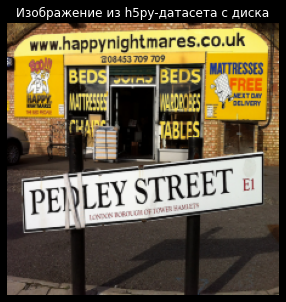

In [ ]:
folder_with_h5 = "/content/drive/MyDrive/Diploma_spring/h5files"
data_name = 'coco_5_caps3_wfreq'
# грузим данные
h5 = h5py.File(os.path.join(folder_with_h5, "train" + '_images_' + data_name + '.hdf5'), 'r')
imgs = h5['images']
ridx = np.random.randint(len(imgs))
plt.figure(figsize=(10, 5))
img = Image.fromarray(imgs[ridx].transpose(1, 2, 0))
plt.title("Изображение из h5py-датасета с диска")
plt.imshow(img)
plt.axis("off")
plt.show()

Все загружено - теперь нам необходимо подготовить датасет, который будем использовать в даталоадерах `torch`. Соответственно, мы ранее подготовили три сабсета - по ним и будет осуществляться загрузка - `{'train', 'val', 'test'}`

In [ ]:
class CaptionDataset(Dataset):

    """Датасет для нашей задачи"""

    def __init__(self, data_folder, data_name, split, transform=None):
        self.split = split
        assert self.split in {'train', 'val', 'test'}
        # открываем файл, который мы ранее подготовили
        self.h5 = h5py.File(os.path.join(
            data_folder, self.split + '_images_' + data_name + '.hdf5'), 'r')
        self.imgs = self.h5['images']
        self.captions_qnt = self.h5.attrs['captions_per_image']
        # грузим предложения и грузим длины
        with open(os.path.join(data_folder, self.split + '_caps_' + data_name + '.json'), 'r') as j:
            self.captions = json.load(j)
        with open(os.path.join(data_folder, self.split + '_caps_len_' + data_name + '.json'), 'r') as j:
            self.caplens = json.load(j)
        # задаем трасформации - нормализация, либо добавить аугментации
        self.transform = transform
        self.dataset_size = len(self.captions)

    def __getitem__(self, ids):
        # у изображения может быть несколько описаний - это надо учитывать при обращении к индексы
        # чтобы взять картинку мы должны брать ids // self.captions_qnt
        # индексы описаний от текущего до текущего плюс captions_qnt
        img = torch.FloatTensor(self.imgs[ids // self.captions_qnt] / 255.)
        if self.transform is not None:
            img = self.transform(img)
        caption = torch.LongTensor(self.captions[ids])
        caplen = torch.LongTensor([self.caplens[ids]])
        # если обучаем - то возвращаем изображения, описания и их длины
        if self.split is 'train':
            return img, caption, caplen
        # если вылидируемся - будем возвращать еще и все описания - для того чтобы посыитать BLEU
        else:
            all_captions = torch.LongTensor(
                self.captions[((ids // self.captions_qnt) * \
                               self.captions_qnt):(((ids // self.captions_qnt) * \
                                                    self.captions_qnt) + self.captions_qnt)])
            return img, caption, caplen, all_captions

    def __len__(self):
        return self.dataset_size

Попробуем наш датасет - если все хорошо - приступим к самому главному - подготовке декодера - и после - мы наконец сможем приступить к обучению нашей архитектры

In [ ]:
# получим словарь для расшифровки
word_map_file = os.path.join(
        folder_with_h5, 'wordmap_' + data_name + '.json')

with open(word_map_file, 'r') as j:
    word_map = json.load(j)
rev_word_map = {v: k for k, v in word_map.items()}

# нормализация под ImageNet
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])
trans = transforms.Compose([normalize])
# задаем даталоадер
train_loader = DataLoader(
              CaptionDataset(folder_with_h5, 
                             data_name,
                             'train',
                             transform=trans),
              batch_size=1, shuffle=True, num_workers=4)

# получаем батч
img, caption, caplen = next(iter(train_loader))

In [ ]:
denorm = UnNormalize(mean=(0.485, 0.456, 0.406), 
                    std=(0.229, 0.224, 0.225)
                   )

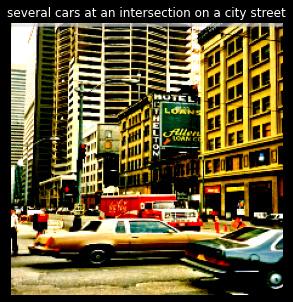

In [ ]:
ridx = 0
seq = caption[ridx].numpy().tolist()[1:]
end = findexact(seq)
seq = seq[:end]
seq = " ".join([rev_word_map[v] for v in seq])

plt.figure(figsize=(10, 5))
plt.imshow(np.clip(denorm(img[ridx].permute(1, 2, 0)).numpy() * .5 + .5, 0, 1))
plt.title(seq)
plt.axis("off")
plt.show()

Все работает, загружается. Можно двигаться дальше

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### 2. LSTM-decoder

Теперь приступим к подготовке декодера. Будем также использовать `soft-attention` - каждому пикселю будет соответствовать свой вес

$$
\sum_{p}^{P} weights_p = 1
$$

<p align="center"><img src="https://drive.google.com/uc?id=1IKBieXmYs6C4UJ-XutFcyc-vwhRoi4Jl"  border="0"></a></p>


Здесь возьмем `LstmCell`. Изначально работали с `LSTM` - последовательность получались менее красивые и bleu4 был пониже, также столкнулся с проблемой нехватки ресурсов. К тому же, она быстрее учится и достаточна для нашей задачи - мы предсказываем на основе эмбеддинга и предсказаний прошлого шага, также используем `attention` - то есть работает по каждой отдельной метке


[Ссылка](#https://medium.com/@kion.kim/lstm-vs-lstmcell-and-others-on-gluon-aac33f7b54ea#:~:text=LSTMCell%20is%20useful%20when%20we,at%20the%20previous%20time%20step.&text=Due%20to%20this%20difference%2C%20LSTM,for%20information%20about%20time%20step)

In [ ]:
class Attention(nn.Module):
    """Аттеншн для нашей архитектруы. Используем SoftMax - вероятности станут 
    весами для наших зкодированных пикселей - то есть сумма всех весов будет равна 1
    реализация в TF2 https://towardsdatascience.com/image-captions-with-attention-in-tensorflow-step-by-step-927dad3569fa
    // https://arxiv.org/pdf/2110.11773.pdf Doubly Stohastic Attention"""

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()
        # преобразовывваем закодированное изображение
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)
        # преобразовываем выходы декодера
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        # линейный слой для преобразования в вектор и подачи в SoftMax
        self.full_att = nn.Linear(attention_dim, 1)
        self.relu = nn.ReLU()
        # считаем веса
        self.softmax = nn.Softmax(dim=1)

    def forward(self, encoder_out, decoder_hidden):
        # считаем аттеншн для выходов энкодера и декодера и получаем вектор
        att_enc = self.encoder_att(encoder_out)
        att_dec = self.decoder_att(decoder_hidden)
        att_final = self.full_att(
            self.relu(att_enc + att_dec.unsqueeze(1))).squeeze(2)
        # теперь получаем вероятности, то есть веса
        pxl_weights = self.softmax(att_final)
        # взвешиваем - то есть получаем контекст
        context = (
            encoder_out * pxl_weights.unsqueeze(2)).sum(dim=1)
        return context, pxl_weights

Теперь перейдем к главному - пищем `decoder` на базе `LSTM`

In [ ]:
class CaptionNet(nn.Module):

    """RNN на без LSTMCell с Attention"""

    def __init__(self,
                 attention_dim=None,
                 embed_dim=None,
                 decoder_dim=None,
                 vocab_size=None,
                 encoder_dim=1280,
                 dropout=0.5):

        super().__init__()
        # выходе энкодера (B, 14, 14, 1280)
        self.encoder_dim = encoder_dim
        # размерность аттеншн
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        # словарь, подготовленный ранее
        self.vocab_size = vocab_size
        self.dropout = dropout
        # слой аттеншн
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)
        # эмбеддинги
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=self.dropout)
        # ячейка LSTM https://pytorch.org/docs/stable/generated/torch.nn.LSTMCell.html
        self.decode_step = nn.LSTMCell(
            embed_dim + encoder_dim, decoder_dim, bias=True)
        # инициализация hidden
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        # инициализация cell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        # линейный слой для gate
        self.gate = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.device = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu")
        self.init_weights()

    def init_hidden_state(self, encoder_out):
        """инициализация весов для cell и hidden"""
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c

    def init_weights(self):
        """иницилиализация весов равномерным распределением для слоя эмбеддингов и fc"""
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, encoder_out, encoded_captions, caption_lengths):

        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size
        # преобразовываем изображение batch x qnt_pixels x encoder_dim
        # (batch_size, num_pixels, encoder_dim)
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)
        num_pixels = encoder_out.size(1)
        # сортируем данные по длине, по убыванию - понадобится в будущем
        # мы сможем по длине отсекать ине генерировать лишние последовательности
        # во время обучения
        caption_lengths, sort_ind = caption_lengths.squeeze(
            1).sort(dim=0, descending=True)

        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]
        # получаем эмбеддинг
        embeddings = self.embedding(encoded_captions)
        # инициализируем веса batch_size, decoder_dim
        h, c = self.init_hidden_state(encoder_out)
        # <EOS> нам не надо кодировать - поэтому из длины мы вычитаем 1
        decode_lengths = (caption_lengths - 1).tolist()

        # создаем тензор, в котором будем хранить информацию о весах и скорах
        predictions = torch.zeros(batch_size, max(
            decode_lengths), vocab_size).to(self.device)
        weights = torch.zeros(batch_size, max(
            decode_lengths), num_pixels).to(self.device)
        for cap in range(max(decode_lengths)):
            # мы можем ограничивать генерацию - ранее отсортировали по длине
            # на инференсе шаг переделаем в beam search
            # cap тут - каждое слово в последовательности
            # можно обозначать как t
            batch_size_cap = sum([l > cap for l in decode_lengths])
            # взвешиваем эмбеддинг
            attention_weighted_encoding, weight = self.attention(encoder_out[:batch_size_cap],
                                                                  h[:batch_size_cap])
            # находим gate для активации эмбеддинга
            gate = self.sigmoid(self.gate(h[:batch_size_cap]))
            attention_weighted_encoding = gate * attention_weighted_encoding
            # подаем все в декодер
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_cap, cap, :],
                          attention_weighted_encoding], dim=1),
                (h[:batch_size_cap], c[:batch_size_cap]))
            # получаем логиты
            preds = self.fc(self.dropout(h))
            # сохраняем логиты и веса по локации метки на данном шаге - тут cap
            # можно t - time-stamp
            predictions[:batch_size_cap, cap, :] = preds
            weights[:batch_size_cap, cap, :] = weight

        return predictions, encoded_captions, decode_lengths, weights, sort_ind

Теперь нам необходимо написать функцию для рассчета `loss`

In [ ]:
def compute_loss(criterion, scores, targets, decode_lengths):
    # упаковываем, используя данные о длине (чтобы убрать временные метки, которые мы не кодировали)
    # ранее мы останавливали кодировку законченных последовательностей
    scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
    targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
    # считаем лосс
    # в scores уже собраны оценки для наших последовательностей, для всех слов
    loss = criterion(scores, targets)
    # лосс суммируется в процессе обучения
    return loss

Теперь приступим к обучению нашей архитектуры

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


## Подготовка к обучению

Подготовим необходимые функции для обучения. затем останется лишь задать параметры и можно приступить к самому интересному. Тут соберем вспомогательные функции: для подсчета accuracy, для подсчета общих метрик, для сохранения checkpoints сразу для обоих моделей, функции обучения и валидации

In [ ]:
def accuracy(scores, targets, k = 3):
    """
    считаем top_k accuracy
    """
    batch_size = targets.size(0)
    _, idx = scores.topk(k, 1)
    correct = idx.eq(targets.view(-1, 1).expand_as(idx))
    correct_total = correct.view(-1).float().sum()
    return correct_total.item() * (100.0 / batch_size)

In [ ]:
class Metrics(object):
    """вспомогательная, чтобы не нагромождать код"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
def save_checkpoint(data_name, epoch, epochs_since_improvement, encoder, decoder, encoder_optimizer, decoder_optimizer,
                    bleu4, is_best):

    state = {'epoch': epoch,
             'epochs_since_improvement': epochs_since_improvement,
             'bleu4': bleu4,
             'encoder': encoder,
             'decoder': decoder,
             'encoder_optimizer': encoder_optimizer,
             'decoder_optimizer': decoder_optimizer}
    filename = 'checkpoint_' + data_name + '.pth'
    torch.save(state, filename)
    if is_best:
        torch.save(state, 'BEST_' + filename)

Теперь подготовим функции обучения и валидации

In [ ]:
def train(train_loader, encoder, decoder, criterion, encoder_optimizer, decoder_optimizer, epoch, device, clip, verbose):
    # обучающая
    losses = Metrics()
    top5accs = Metrics()

    iter_losses = []

    decoder.train()
    encoder.train()

    ALPHA = 1

    for idx, (imgs, caps, caplens) in enumerate(train_loader):
        imgs = imgs.to(device)
        caps = caps.to(device)
        caplens = caplens.to(device)
        imgs = encoder(imgs)
        scores, caps_sorted, decode_lengths, weights, sort_ind = decoder(
            imgs, caps, caplens)
        # считаем после токена <SOS> и до <EOS>
        targets = caps_sorted[:, 1:]
        loss = compute_loss(criterion, scores, targets, decode_lengths)
        loss += ALPHA * ((1. - weights.sum(dim=1))**2).mean()

        decoder_optimizer.zero_grad()
        if encoder_optimizer is not None:
            encoder_optimizer.zero_grad()
        loss.backward()
        # clip grad
        torch.nn.utils.clip_grad_norm_(decoder.parameters(), clip)
        decoder_optimizer.step()
        if encoder_optimizer is not None:
            encoder_optimizer.step()

        # cобираем метрики
        scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
        targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        top5 = accuracy(scores, targets, 5)
        losses.update(loss.item(), sum(decode_lengths))
        top5accs.update(top5, sum(decode_lengths))
        iter_losses.append(losses.avg)
        if idx % verbose == 0 or idx == len(train_loader):
            print('Эпоха: [{0}][{1}/{2}]\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})'.format(epoch + 1, idx, len(train_loader),
                                                                          loss=losses,
                                                                          top5=top5accs))
    return iter_losses

In [ ]:
def validate(val_loader, encoder, decoder, criterion, device, verbose):
    # для валидации
    ALPHA = 1
    iter_losses = []
    decoder.eval()
    encoder.eval()
    rev_word_map = {v: k for k, v in word_map.items()}
    losses = Metrics()
    top5accs = Metrics()

    references, hypotheses = [], []
    with torch.no_grad():
        for idx, (imgs, caps, caplens, allcaps) in enumerate(val_loader):
            imgs = imgs.to(device)
            caps = caps.to(device)
            caplens = caplens.to(device)
            imgs = encoder(imgs)
            scores, caps_sorted, decode_lengths, weights, sort_ind = decoder(
                imgs, caps, caplens)
            # считаем после токена <SOS> и до <EOS>
            targets = caps_sorted[:, 1:]
            loss = compute_loss(criterion, scores, targets, decode_lengths)
            loss += ALPHA * ((1. - weights.sum(dim=1))**2).mean()
            score_res = scores.clone()
            # cобираем метрики
            scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            top5 = accuracy(scores, targets, 5)
            losses.update(loss.item(), sum(decode_lengths))
            top5accs.update(top5, sum(decode_lengths))
            iter_losses.append(losses.avg)
            if idx % verbose == 0 or idx == len(val_loader):
                print('Validation: [{0}/{1}]\t'
                      'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                      'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})\t'.format(idx, len(val_loader),
                                                                                loss=losses, top5=top5accs))

            allcaps = allcaps[sort_ind]
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                
                img_captions = list(
                    map(lambda c: [w for w in c if w not in {word_map['<SOS>'], word_map['<PAD>']}],
                        img_caps))  # убираем <SOS> and <PAD>
                img_captions = [[rev_word_map[v] for v in lv] for lv in img_captions]  # приводим к словам
                references.append(img_captions)
            # предсказания
            _, preds = torch.max(score_res, dim=2)
            preds = preds.tolist()
            temp_preds = []
            for j, p in enumerate(preds):
                # убираем <PAD>
                temp_preds.append(preds[j][:decode_lengths[j]])
            preds = temp_preds
            preds = [[rev_word_map[v] for v in lv] for lv in preds] # приводим к словам
            hypotheses.extend(preds)
            assert len(references) == len(hypotheses)
        bleu4 = corpus_bleu(references, hypotheses) * 100

        print(
            '\n * Loss - {loss.avg:.3f}, top-5 Accuracy - {top5.avg:.3f}, bleu-4 - {bleu}\n'.format(
                loss=losses,
                top5=top5accs,
                bleu=bleu4))

    return bleu4, iter_losses

In [ ]:
def fit(folder_with_h5,
        data_name,
        batch_size,
        decoder,
        encoder,
        criterion,
        verbose,
        patience,
        epochs,
        encoder_optimizer,
        decoder_optimizer,
        clip):

    # создаем вспомогательные списки и переменные
    train_loss = []
    val_loss = []
    best_bleu4 = 0
    wait = 0

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # подгружаем idx2word словарь
    word_map_file = os.path.join(
        folder_with_h5, 'wordmap_' + data_name + '.json')
    with open(word_map_file, 'r') as j:
        word_map = json.load(j)
    # модели отправляем на device
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    trans = transforms.Compose([normalize])
    # задаем даталоадер train и val
    train_loader = DataLoader(
        CaptionDataset(folder_with_h5,
                       data_name,
                       'train',
                       transform=trans),
        batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(
        CaptionDataset(folder_with_h5,
                       data_name,
                       'val',
                       transform=trans),
        batch_size=batch_size, shuffle=True, num_workers=0)
    # учим N epochs
    for epoch in range(epochs):
        # это ранняя остановка
        if wait == patience:
            break
        # находим метрики на обучении
        train_losses = train(train_loader=train_loader,
                             encoder=encoder,
                             decoder=decoder,
                             criterion=criterion,
                             encoder_optimizer=encoder_optimizer,
                             decoder_optimizer=decoder_optimizer,
                             epoch=epoch,
                             device=device,
                             clip=clip,
                             verbose=verbose)

        train_loss.append(train_losses)
        # теперь находим метрики на валидации
        recent_bleu4, val_losses = validate(val_loader=val_loader,
                                            encoder=encoder,
                                            decoder=decoder,
                                            criterion=criterion,
                                            device=device, verbose=100)

        val_loss.append(val_losses)
        # смотрим по bleu4, когда останавливаться
        is_best = recent_bleu4 >= best_bleu4
        best_bleu4 = max(recent_bleu4, best_bleu4)
        if not is_best:
            wait += 1
        else:
            wait = 0
        # сохраняем модель
        save_checkpoint(data_name, epoch, patience, encoder, decoder, encoder_optimizer,
                        decoder_optimizer, recent_bleu4, is_best)

    return train_loss, val_loss

Все готово, можем приступать к обучению. По результам у нас есть все необходимое, чтобы мы могли пробовать обучать нашу архитектуру

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


## Обучение

Мы подготовили основные функции, которые на помогут в обучении, написали энкодер и декодер - можно приступать к обучению. 

In [ ]:
folder_with_h5 = "/content/drive/MyDrive/Diploma_spring/h5files"
data_name = 'coco_5_caps3_wfreq'
# подгружаем словарь
word_map_file = os.path.join(folder_with_h5, 'wordmap_' + data_name + '.json')
with open(word_map_file, 'r') as j:
    word_map = json.load(j)
# задаем основные параметры
batch_size = 64
attention_dim = 512
embed_dim = 512
decoder_dim = 512
vocab_size = len(word_map)
verbose = 2000
epochs = 42
clip = 1
patience = 5

# создаем модели и оптимизаторы
encoder = EffNet()
encoder_optimizer = torch.optim.Adam(
    [p for p in encoder.parameters() if p.requires_grad], betas=(0.9, 0.999), eps=1e-5
)
decoder = CaptionNet(attention_dim=attention_dim,
                     embed_dim=embed_dim,
                     decoder_dim=decoder_dim,
                     vocab_size=vocab_size
                     )
decoder_optimizer = torch.optim.Adam(decoder.parameters(), lr=3e-4)
criterion = nn.CrossEntropyLoss()

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/efficientnet_b0_ra-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_ra-3dd342df.pth


Keep block 0 frozen
Keep block 1 frozen
Keep block 2 frozen
Keep block 3 frozen
Keep block 4 frozen
Keep block 5 frozen
Unfreeze block 6
Unfreeze block conv_head
Unfreeze block act2
Unfreeze block global_pool
Unfreeze block classifier


Обучим и посмотрим на результаты. Если все получится - попробуем сгенерировать описания на различных изображениях. Учится достаточно долго. В обучающей выборке свыше `80 000` изображений. Валидация - `5000` изображений. На одну эпоху уходит примерно `1 час 50 минут` с тестированием. Но зато все влазит в бесплатный лимит `collab`. Но бесплатного `collab` хватает на 4 эпохи. Пришлось учить в `datashpera` - ниже будут приведены результаты обучения как вставка из вывода модели при обучении

In [ ]:
# обучаем
train_loss, val_loss = fit(folder_with_h5=folder_with_h5,
                          data_name=data_name,
                          batch_size=batch_size,
                          decoder=decoder, 
                          encoder=encoder, 
                          criterion=criterion, 
                          verbose=verbose, 
                          patience=patience,
                          epochs=epochs,
                          encoder_optimizer=encoder_optimizer, 
                          decoder_optimizer=decoder_optimizer,
                          clip=clip)

### Логи обучения

Обучение производилось в DataSpehra, заняло около 10 часов

```python

  Эпоха: [1][0/6468]	Loss 10.2675 (10.2675)	Top-5 Accuracy 0.000 (0.000)
  Эпоха: [1][2000/6468]	Loss 3.9865 (4.6024)	Top-5 Accuracy 66.799 (58.296)
  Эпоха: [1][4000/6468]	Loss 3.7820 (4.2501)	Top-5 Accuracy 68.783 (62.763)
  Эпоха: [1][6000/6468]	Loss 3.3970 (4.0703)	Top-5 Accuracy 73.669 (65.048)
  Validation: [0/391]	Loss 3.6320 (3.6320)	Top-5 Accuracy 70.171 (70.171)	
  Validation: [100/391]	Loss 3.6581 (3.5465)	Top-5 Accuracy 71.020 (71.394)	
  Validation: [200/391]	Loss 3.5055 (3.5386)	Top-5 Accuracy 71.644 (71.659)	
  Validation: [300/391]	Loss 3.4379 (3.5388)	Top-5 Accuracy 72.753 (71.675)	

 * Loss - 3.543, top-5 Accuracy - 71.654, bleu-4 - 19.26419950007738

  Эпоха: [2][0/6468]	Loss 3.5014 (3.5014)	Top-5 Accuracy 72.122 (72.122)
  Эпоха: [2][2000/6468]	Loss 3.5198 (3.5435)	Top-5 Accuracy 72.306 (71.719)
  Эпоха: [2][4000/6468]	Loss 3.3836 (3.5160)	Top-5 Accuracy 72.418 (72.084)
  Эпоха: [2][6000/6468]	Loss 3.1400 (3.4954)	Top-5 Accuracy 76.269 (72.364)
  Validation: [0/391]	Loss 3.4554 (3.4554)	Top-5 Accuracy 73.203 (73.203)	
  Validation: [100/391]	Loss 3.2774 (3.3613)	Top-5 Accuracy 75.033 (74.050)	
  Validation: [200/391]	Loss 3.3170 (3.3613)	Top-5 Accuracy 73.018 (73.986)	
  Validation: [300/391]	Loss 3.1375 (3.3715)	Top-5 Accuracy 76.648 (73.870)	

 * Loss - 3.376, top-5 Accuracy - 73.831, bleu-4 - 21.0288648848136

  Эпоха: [3][0/6468]	Loss 3.2446 (3.2446)	Top-5 Accuracy 74.523 (74.523)
  Эпоха: [3][2000/6468]	Loss 3.4284 (3.3478)	Top-5 Accuracy 73.418 (74.234)
  Эпоха: [3][4000/6468]	Loss 3.3533 (3.3389)	Top-5 Accuracy 72.640 (74.358)
  Эпоха: [3][6000/6468]	Loss 3.4657 (3.3306)	Top-5 Accuracy 72.043 (74.479)
  Validation: [0/391]	Loss 3.2486 (3.2486)	Top-5 Accuracy 75.894 (75.894)	
  Validation: [100/391]	Loss 3.4461 (3.2934)	Top-5 Accuracy 74.050 (74.987)	
  Validation: [200/391]	Loss 3.0867 (3.3027)	Top-5 Accuracy 79.300 (74.849)	
  Validation: [300/391]	Loss 3.1258 (3.3007)	Top-5 Accuracy 77.248 (74.858)	

 * Loss - 3.300, top-5 Accuracy - 74.841, bleu-4 - 21.86045379826164

  Эпоха: [4][0/6468]	Loss 3.2009 (3.2009)	Top-5 Accuracy 75.881 (75.881)
  Эпоха: [4][2000/6468]	Loss 3.1884 (3.2274)	Top-5 Accuracy 76.471 (75.777)
  Эпоха: [4][4000/6468]	Loss 3.0518 (3.2275)	Top-5 Accuracy 79.167 (75.804)
  Эпоха: [4][6000/6468]	Loss 3.3204 (3.2267)	Top-5 Accuracy 74.387 (75.839)
  Validation: [0/391]	Loss 3.1074 (3.1074)	Top-5 Accuracy 76.525 (76.525)	
  Validation: [100/391]	Loss 3.1985 (3.2665)	Top-5 Accuracy 76.376 (75.198)	
  Validation: [200/391]	Loss 3.5140 (3.2617)	Top-5 Accuracy 70.888 (75.307)	
  Validation: [300/391]	Loss 3.2061 (3.2600)	Top-5 Accuracy 75.502 (75.355)	

 * Loss - 3.260, top-5 Accuracy - 75.384, bleu-4 - 22.548472760408007

  Эпоха: [5][0/6468]	Loss 3.1552 (3.1552)	Top-5 Accuracy 75.654 (75.654)
  Эпоха: [5][2000/6468]	Loss 3.3864 (3.1400)	Top-5 Accuracy 74.866 (76.957)
  Эпоха: [5][4000/6468]	Loss 3.1802 (3.1456)	Top-5 Accuracy 78.393 (76.906)
  Эпоха: [5][6000/6468]	Loss 2.9593 (3.1503)	Top-5 Accuracy 81.312 (76.853)
  Validation: [0/391]	Loss 3.2635 (3.2635)	Top-5 Accuracy 75.657 (75.657)	
  Validation: [100/391]	Loss 3.3017 (3.2643)	Top-5 Accuracy 74.798 (75.351)	
  Validation: [200/391]	Loss 3.1949 (3.2540)	Top-5 Accuracy 76.113 (75.490)	
  Validation: [300/391]	Loss 3.3081 (3.2405)	Top-5 Accuracy 75.378 (75.670)	

 * Loss - 3.239, top-5 Accuracy - 75.702, bleu-4 - 22.50195055371371

  Эпоха: [6][0/6468]	Loss 2.9501 (2.9501)	Top-5 Accuracy 80.057 (80.057)
  Эпоха: [6][2000/6468]	Loss 2.9191 (3.0782)	Top-5 Accuracy 80.199 (77.779)
  Эпоха: [6][4000/6468]	Loss 3.0324 (3.0854)	Top-5 Accuracy 78.523 (77.714)
  Эпоха: [6][6000/6468]	Loss 2.9177 (3.0903)	Top-5 Accuracy 79.815 (77.668)
  Validation: [0/391]	Loss 3.2489 (3.2489)	Top-5 Accuracy 75.549 (75.549)	
  Validation: [100/391]	Loss 3.0541 (3.2342)	Top-5 Accuracy 78.649 (75.810)	
  Validation: [200/391]	Loss 3.0349 (3.2312)	Top-5 Accuracy 76.754 (75.837)	
  Validation: [300/391]	Loss 3.2007 (3.2238)	Top-5 Accuracy 74.259 (75.935)	

 * Loss - 3.221, top-5 Accuracy - 75.961, bleu-4 - 22.78501227016396

  Эпоха: [7][0/6468]	Loss 2.8821 (2.8821)	Top-5 Accuracy 81.157 (81.157)
  Эпоха: [7][2000/6468]	Loss 2.9952 (3.0248)	Top-5 Accuracy 79.263 (78.509)
  Эпоха: [7][4000/6468]	Loss 2.9094 (3.0347)	Top-5 Accuracy 79.833 (78.391)
  Эпоха: [7][6000/6468]	Loss 3.2083 (3.0393)	Top-5 Accuracy 76.610 (78.354)
  Validation: [0/391]	Loss 3.2454 (3.2454)	Top-5 Accuracy 75.664 (75.664)	
  Validation: [100/391]	Loss 3.1303 (3.2246)	Top-5 Accuracy 77.361 (75.964)	
  Validation: [200/391]	Loss 3.3303 (3.2165)	Top-5 Accuracy 76.816 (76.008)	
  Validation: [300/391]	Loss 3.3179 (3.2097)	Top-5 Accuracy 74.422 (76.102)	

 * Loss - 3.208, top-5 Accuracy - 76.099, bleu-4 - 22.92978646024404

  Эпоха: [8][0/6468]	Loss 3.0619 (3.0619)	Top-5 Accuracy 78.134 (78.134)
  Эпоха: [8][2000/6468]	Loss 2.9707 (2.9772)	Top-5 Accuracy 78.990 (79.149)
  Эпоха: [8][4000/6468]	Loss 2.9409 (2.9873)	Top-5 Accuracy 77.748 (79.028)
  Эпоха: [8][6000/6468]	Loss 3.0916 (2.9954)	Top-5 Accuracy 77.470 (78.931)
  Validation: [0/391]	Loss 3.1819 (3.1819)	Top-5 Accuracy 75.613 (75.613)	
  Validation: [100/391]	Loss 3.1345 (3.2143)	Top-5 Accuracy 76.741 (76.049)	
  Validation: [200/391]	Loss 3.2915 (3.2038)	Top-5 Accuracy 76.184 (76.181)	
  Validation: [300/391]	Loss 3.3792 (3.2046)	Top-5 Accuracy 74.198 (76.142)	

 * Loss - 3.205, top-5 Accuracy - 76.153, bleu-4 - 23.145147717178794

  Эпоха: [9][0/6468]	Loss 3.0051 (3.0051)	Top-5 Accuracy 78.062 (78.062)
  Эпоха: [9][2000/6468]	Loss 3.0011 (2.9348)	Top-5 Accuracy 78.249 (79.692)
  Эпоха: [9][4000/6468]	Loss 3.0957 (2.9469)	Top-5 Accuracy 77.049 (79.545)
  Эпоха: [9][6000/6468]	Loss 3.1389 (2.9565)	Top-5 Accuracy 78.591 (79.431)
  Validation: [0/391]	Loss 3.2006 (3.2006)	Top-5 Accuracy 77.291 (77.291)	
  Validation: [100/391]	Loss 3.5674 (3.1960)	Top-5 Accuracy 69.783 (76.394)	
  Validation: [200/391]	Loss 3.2461 (3.1989)	Top-5 Accuracy 76.000 (76.306)	
  Validation: [300/391]	Loss 3.0826 (3.2003)	Top-5 Accuracy 79.255 (76.296)	

 * Loss - 3.200, top-5 Accuracy - 76.299, bleu-4 - 22.95835281116552

  Эпоха: [10][0/6468]	Loss 2.8458 (2.8458)	Top-5 Accuracy 81.931 (81.931)
  Эпоха: [10][2000/6468]	Loss 3.1023 (2.8999)	Top-5 Accuracy 77.419 (80.141)
  Эпоха: [10][4000/6468]	Loss 2.8525 (2.9130)	Top-5 Accuracy 81.992 (79.987)
  Эпоха: [10][6000/6468]	Loss 2.7568 (2.9204)	Top-5 Accuracy 82.434 (79.911)
  Validation: [0/391]	Loss 3.0454 (3.0454)	Top-5 Accuracy 76.748 (76.748)	
  Validation: [100/391]	Loss 3.3956 (3.2191)	Top-5 Accuracy 74.069 (76.066)	
  Validation: [200/391]	Loss 3.1540 (3.2069)	Top-5 Accuracy 76.545 (76.214)	
  Validation: [300/391]	Loss 3.3748 (3.2059)	Top-5 Accuracy 73.901 (76.252)	

 * Loss - 3.201, top-5 Accuracy - 76.332, bleu-4 - 23.041095974304167

  Эпоха: [11][0/6468]	Loss 3.0674 (3.0674)	Top-5 Accuracy 78.170 (78.170)
  Эпоха: [11][2000/6468]	Loss 2.8745 (2.8625)	Top-5 Accuracy 79.012 (80.674)
  Эпоха: [11][4000/6468]	Loss 2.8545 (2.8777)	Top-5 Accuracy 79.887 (80.462)
  Эпоха: [11][6000/6468]	Loss 2.8536 (2.8872)	Top-5 Accuracy 79.570 (80.355)
  Validation: [0/391]	Loss 3.1806 (3.1806)	Top-5 Accuracy 77.154 (77.154)	
  Validation: [100/391]	Loss 3.1014 (3.1853)	Top-5 Accuracy 76.102 (76.605)	
  Validation: [200/391]	Loss 3.2887 (3.1921)	Top-5 Accuracy 75.207 (76.482)	
  Validation: [300/391]	Loss 3.4590 (3.1982)	Top-5 Accuracy 74.266 (76.457)	

 * Loss - 3.204, top-5 Accuracy - 76.390, bleu-4 - 23.139394543655513

  Эпоха: [12][0/6468]	Loss 2.7335 (2.7335)	Top-5 Accuracy 83.075 (83.075)
  Эпоха: [12][2000/6468]	Loss 2.7680 (2.8317)	Top-5 Accuracy 82.087 (81.047)
  Эпоха: [12][4000/6468]	Loss 3.0113 (2.8472)	Top-5 Accuracy 78.630 (80.868)
  Эпоха: [12][6000/6468]	Loss 2.8137 (2.8567)	Top-5 Accuracy 81.446 (80.760)
  Validation: [0/391]	Loss 3.2647 (3.2647)	Top-5 Accuracy 75.245 (75.245)	
  Validation: [100/391]	Loss 3.3279 (3.2008)	Top-5 Accuracy 74.694 (76.470)	
  Validation: [200/391]	Loss 3.3703 (3.2159)	Top-5 Accuracy 75.844 (76.248)	
  Validation: [300/391]	Loss 3.0664 (3.2111)	Top-5 Accuracy 78.926 (76.272)	

 * Loss - 3.209, top-5 Accuracy - 76.341, bleu-4 - 23.101757275163905

  Эпоха: [13][0/6468]	Loss 2.9628 (2.9628)	Top-5 Accuracy 79.484 (79.484)
  Эпоха: [13][2000/6468]	Loss 2.7915 (2.7984)	Top-5 Accuracy 82.320 (81.536)
  Эпоха: [13][4000/6468]	Loss 2.8122 (2.8159)	Top-5 Accuracy 80.999 (81.311)
  Эпоха: [13][6000/6468]	Loss 2.9021 (2.8286)	Top-5 Accuracy 81.060 (81.137)
  Validation: [0/391]	Loss 2.9136 (2.9136)	Top-5 Accuracy 79.396 (79.396)	
  Validation: [100/391]	Loss 3.5415 (3.2130)	Top-5 Accuracy 73.380 (76.289)	
  Validation: [200/391]	Loss 3.2784 (3.2045)	Top-5 Accuracy 74.966 (76.448)	
  Validation: [300/391]	Loss 3.2308 (3.2055)	Top-5 Accuracy 77.198 (76.410)	

 * Loss - 3.214, top-5 Accuracy - 76.314, bleu-4 - 23.027469663625368

```

### Тестирование

И посмотрим, что у нас получается на тестовой выборке. Для этого подготовит специальную функцию. В идеале их всех лучше собрать в самом начале, но для удобства чтения - они появляются по мере необходимости

In [ ]:
def test(test_loader, encoder, decoder, criterion, device, verbose):
    # для тестирования
    ALPHA = 1
    losses = Metrics()
    top5accs = Metrics()
    references = list()
    predictions = list()
    rev_word_map = {v: k for k, v in word_map.items()}
    with torch.no_grad():
        for idx, (imgs, caps, caplens, allcaps) in enumerate(test_loader):
            imgs = imgs.to(device)
            caps = caps.to(device)
            caplens = caplens.to(device)
            imgs = encoder(imgs)
            scores, caps_sorted, decode_lengths, weights, sort_ind = decoder(
                imgs, caps, caplens)
            # считаем после токена <SOS> и до <EOS>
            targets = caps_sorted[:, 1:]
            loss = compute_loss(criterion, scores, targets, decode_lengths)
            # Doubly Stochastic Attention-регуляризация
            loss += ALPHA * ((1. - weights.sum(dim=1))**2).mean()
            score_res = scores.clone()
            # cобираем метрики
            scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            top5 = accuracy(scores, targets, 5)
            losses.update(loss.item(), sum(decode_lengths))
            top5accs.update(top5, sum(decode_lengths))

            if idx % verbose == 0 or idx == len(test_loader):
                print('Test: [{0}/{1}]\t'
                      'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                      'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})\t'.format(idx, len(test_loader),
                                                                                loss=losses, top5=top5accs))
                
            # вынимаем все captions для данного изображения
            allcaps = allcaps[sort_ind]
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                img_captions = list(
                    map(lambda c: [w for w in c if w not in {word_map['<SOS>'], word_map['<PAD>']}],
                        img_caps))  # убираем <SOS> and <PAD>
                img_captions = [[rev_word_map[v] for v in lv] for lv in img_captions]  # приводим к словам
                references.append(img_captions)

            # предсказания - берем максимальные по каждому предсказанию
            # и вытаскиваем индексы
            _, preds = torch.max(score_res, dim=2)
            preds = preds.tolist()
            temp_preds = list()
            for j, p in enumerate(preds):
                # убираем <PAD>
                temp_preds.append(preds[j][:decode_lengths[j]])
            preds = temp_preds
            preds = [[rev_word_map[v] for v in lv] for lv in preds] # приводим к словам
            predictions.extend(preds)

            assert len(references) == len(predictions)
        bleu4 = corpus_bleu(references, predictions) * 100

        print(
            '\n * Loss - {loss.avg:.3f}, top-5 Accuracy - {top5.avg:.3f}, bleu-4 - {bleu}\n'.format(
                loss=losses,
                top5=top5accs,
                bleu=bleu4))

    return bleu4

Функция готова - перейдем к тестированию. Зададим `dataloader`, загрузим словарь и назначим трансформации в виде нормализации. `resize` мы уже делали ранее. Также проверим, чтобы наши модели загружались как надо

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
folder_with_h5 = "/content/drive/MyDrive/Diploma_spring/h5files"
data_name = 'coco_5_caps3_wfreq'
model = "/content/drive/MyDrive/Diploma_spring/models_1/BEST_checkpoint_coco_5_caps3_wfreq.pth"
batch_size = 64
criterion = nn.CrossEntropyLoss()
# загрузим модели
checkpoint = torch.load(model, map_location=str(device))
decoder = checkpoint['decoder']
decoder = decoder.to(device)
decoder.eval()
encoder = checkpoint['encoder']
encoder = encoder.to(device)
encoder.eval()

# подгружаем idx2word словарь
word_map_file = os.path.join(
    folder_with_h5, 'wordmap_' + data_name + '.json')
with open(word_map_file, 'r') as j:
    word_map = json.load(j)
# нормализация
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                  std=[0.229, 0.224, 0.225])
trans = transforms.Compose([normalize])
# задаем даталоадер test
test_loader = DataLoader(
    CaptionDataset(folder_with_h5,
                    data_name,
                    'test',
                    transform=trans),
    batch_size=batch_size, shuffle=True, num_workers=0)

bleu = test(test_loader, encoder, decoder, criterion, device, 100)
print(f"BLEU-4 score для тестовой выборки: {bleu}")

Test: [0/391]	Loss 3.4426 (3.4426)	Top-5 Accuracy 71.084 (71.084)	
Test: [100/391]	Loss 3.1512 (3.2483)	Top-5 Accuracy 77.260 (75.801)	
Test: [200/391]	Loss 3.1270 (3.2321)	Top-5 Accuracy 76.722 (75.837)	
Test: [300/391]	Loss 3.1975 (3.2261)	Top-5 Accuracy 76.283 (75.936)	

 * Loss - 3.228, top-5 Accuracy - 75.948, bleu-4 - 23.16248415309932

BLEU-4 score для тестовой выборки: 23.16248415309932


```python

Результаты модели на конец 13ой эпохи, перед ранней остановкой

Test: [0/391]	Loss 3.2431 (3.2431)	Top-5 Accuracy 75.643 (75.643)	
Test: [100/391]	Loss 3.4244 (3.2548)	Top-5 Accuracy 75.204 (75.906)	
Test: [200/391]	Loss 3.3833 (3.2520)	Top-5 Accuracy 75.236 (75.807)	
Test: [300/391]	Loss 2.9549 (3.2465)	Top-5 Accuracy 80.135 (75.954)	

 * Loss - 3.237, top-5 Accuracy - 76.112, bleu-4 - 23.0868579487844

BLEU-4 score для тестовой выборки: 23.0868579487844


```

Достаточно неплохо, модель хорошо обобщается - результаты получены аналогичны тем, что мы видели при обучении и валидации. Попробуем потестировать на случайных изображениях

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___



### Генератор описания

Теперь приступим к тестированию. Подготовим генератор текстового описания. Будем подавать изображения и смотреть, что выдает нам наша архитектура. Потом протестируем на случайных изображениях, возьмем разнообразные - попробуем попасть в домен `COCO` и `ImageNet`

In [ ]:
def convert(img, target_type_min, target_type_max, target_type):
    """приводим к uint8 для сохранения h5py размер 224 на 224"""
    imin = img.min()
    imax = img.max()
    a = (target_type_max - target_type_min) / (imax - imin)
    b = target_type_max - a * imax
    new_img = (a * img + b).astype(target_type)
    return new_img.astype(np.uint8)

In [ ]:
def generate_caption(encoder, decoder, image_path, word_map, device, beam_size=10):

    k = beam_size
    vocab_size = len(word_map)
    decoder = decoder.to(device)
    encoder = encoder.to(device)
    # читаем изображение
    img = np.array(Image.open(image_path))
    if len(img.shape) == 2:
        img = img[:, :, np.newaxis]
        img = np.concatenate([img, img, img], axis=2)
    # приводим инпут к нашему формату
    img = resize(img, (224, 224))
    img = np.transpose(img, (2, 0, 1))
    img = convert(img, 0, 255, np.uint8)
    img = torch.FloatTensor(img / 255.)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img)
    # делаем unsqueeze, чтобы добавить размерность батча
    image = image.unsqueeze(0).to(device)
    # кодируем

    with torch.no_grad():

        encoder_out = encoder(image)
        enc_image_size = encoder_out.size(1)
        encoder_dim = encoder_out.size(3)
        # flatten
        encoder_out = encoder_out.view(1, -1, encoder_dim)
        num_pixels = encoder_out.size(1)
        encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)
        # здесь будем хранить k предыдущих слов на каждом шаге - сначала <SOS>
        k_prev_words = torch.LongTensor([[word_map['<SOS>']]] * k).to(device)
        seqs = k_prev_words
        # здесь храним скоры
        top_k_scores = torch.zeros(k, 1).to(device)
        # здесь храним веса из аттенш
        seqs_weights = torch.ones(k, 1, enc_image_size,
                                enc_image_size).to(device)
        # здесь собираем окончательные последовательности
        complete_seqs, complete_seqs_weights, complete_seqs_scores = [], [], []
        # начинаем декодировать
        step = 1
        h, c = decoder.init_hidden_state(encoder_out)
        while True:

            embeddings = decoder.embedding(k_prev_words).squeeze(1)
            context, weights = decoder.attention(encoder_out, h)
            weights = weights.view(-1, enc_image_size, enc_image_size)
            gate = decoder.sigmoid(decoder.gate(h)) # для контекста, у нас LSTMCell
            context = gate * context
            h, c = decoder.decode_step(
                torch.cat([embeddings, context], dim=1), (h, c))

            scores = decoder.fc(h)
            scores = F.log_softmax(scores, dim=1) # log_softmax вместо softmax для beam_search
            scores = top_k_scores.expand_as(scores) + scores

            # на первом шаге скоры все одинаковые
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0)
            # дальше уже ищем топ-слова
            else:
                top_k_scores, top_k_words = scores.view(
                    -1).topk(k, 0)
                
            prev_word_idx = top_k_words // vocab_size
            next_word_idx = top_k_words % vocab_size
            # добавляем слова в последовательность
            seqs = torch.cat(
                [seqs[prev_word_idx], next_word_idx.unsqueeze(1)], dim=1)
            seqs_weights = torch.cat([seqs_weights[prev_word_idx], weights[prev_word_idx].unsqueeze(1)],
                                   dim=1)
            # проверяем последовательности, где нет <EOS> - то есть еще не закончены
            incomplete_idx = [ind for ind, next_word in enumerate(next_word_idx) if
                               next_word != word_map['<EOS>']]
            complete_idx = list(
                set(range(len(next_word_idx))) - set(incomplete_idx))
            # откладываем законченные последовательности и уменьшаем bim k
            if len(complete_idx) > 0:
                complete_seqs.extend(seqs[complete_idx].tolist())
                complete_seqs_weights.extend(seqs_weights[complete_idx].tolist())
                complete_seqs_scores.extend(top_k_scores[complete_idx])
            k -= len(complete_idx)
            # работаем с незаконченными последовательностями
            if k == 0:
                break
            seqs = seqs[incomplete_idx]
            seqs_weights = seqs_weights[incomplete_idx]
            h = h[prev_word_idx[incomplete_idx]]
            c = c[prev_word_idx[incomplete_idx]]
            encoder_out = encoder_out[prev_word_idx[incomplete_idx]]
            top_k_scores = top_k_scores[incomplete_idx].unsqueeze(1)
            k_prev_words = next_word_idx[incomplete_idx].unsqueeze(1)
            # если шагов слишком много - заканчиваем
            if step > 42:
                break
            step += 1

        i = complete_seqs_scores.index(max(complete_seqs_scores))
        seq = complete_seqs[i]
        weight = complete_seqs_weights[i]
        return seq, weight, complete_seqs


def visualize_att(image_path, seq, weight, rev_word_map, smooth=True):
    """
    для визуализации аттеншн
    https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb

    """
    fig = plt.figure(figsize=(15, 15))
    image = Image.open(image_path)
    image = image.resize([14 * 20, 14 * 20], Image.LANCZOS)
    words = [rev_word_map[ind] for ind in seq]
    fig.suptitle("Визуализация attention", fontsize="x-large")
    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)
        plt.text(0, 1, '%s' % (words[t]), color='black',
                 backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        cur_weight = weight[t, :]
        if smooth:
            wa = pyramid_expand(cur_weight.numpy(), upscale=20, sigma=12)
        else:
            wa = resize(cur_weight.numpy(), [14 * 20, 14 * 20])
        if t == 0:
            plt.imshow(wa, alpha=0)
        else:
            plt.imshow(wa, alpha=0.72)
        plt.axis('off')
        plt.set_cmap(cm.Blues)
    plt.tight_layout()
    plt.show()

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### Тестовый инференс

Грузим с диска наши модели и основные вспомогательные данные. После этого скачаем пару заготовленных изображений и проверим текстовое описание. Здесь будем генерировать с помощью [`beam search`](#https://towardsdatascience.com/foundations-of-nlp-explained-visually-beam-search-how-it-works-1586b9849a24)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
folder_with_h5 = "/content/drive/MyDrive/Diploma_spring/h5files"
data_name = 'coco_5_caps3_wfreq'
model = "/content/drive/MyDrive/Diploma_spring/models_1/BEST_checkpoint_coco_5_caps3_wfreq.pth"

# загрузим модели
checkpoint = torch.load(model, map_location=device)
decoder = checkpoint['decoder']
decoder.eval()
encoder = checkpoint['encoder']
encoder.eval()
beam_size = 5

# подготовим словарь idx2word

word_map_file = os.path.join(folder_with_h5, 'wordmap_' + data_name + '.json')
with open(word_map_file, 'r') as j:
    word_map = json.load(j)
rev_word_map = {v: k for k, v in word_map.items()}

In [ ]:
%%capture
# скачиваем изображения, размер 224 на 224 для ресайза
!wget https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img_001.jpg
!wget http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img_002.jpg

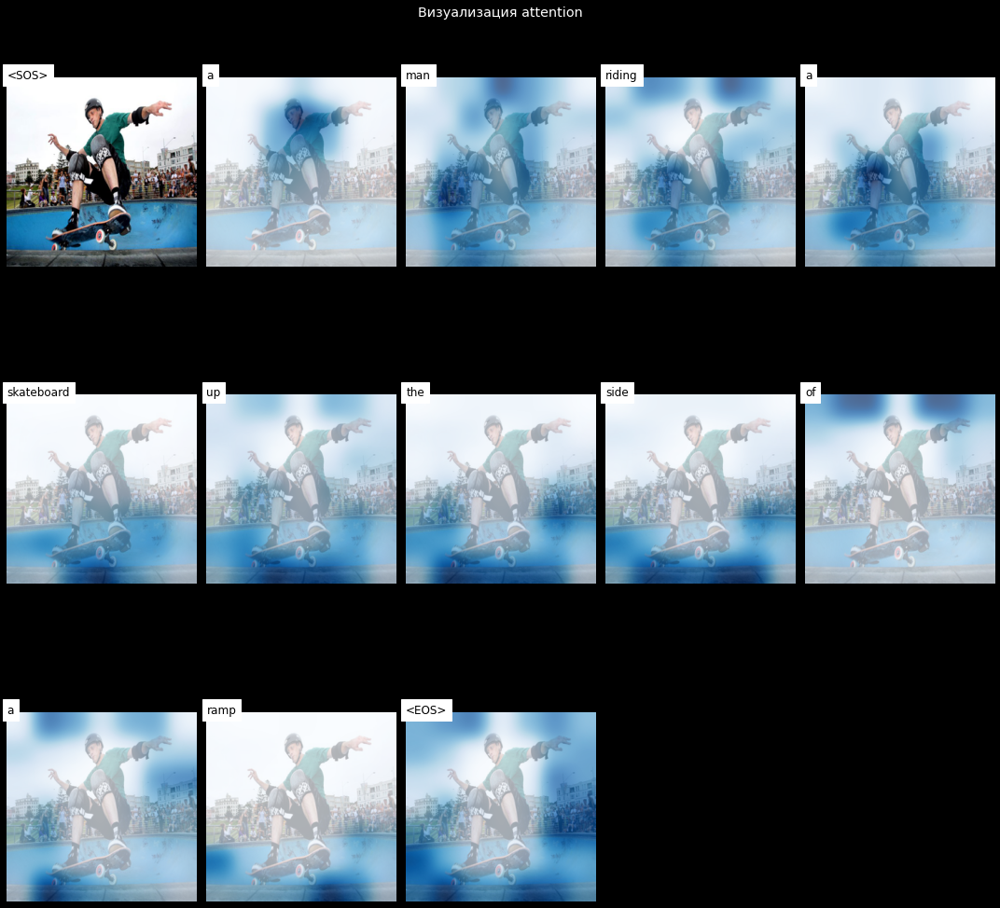

In [ ]:
# смотрим первое изображение
img_001 = "/content/img_001.jpg"
seq, weight, all = generate_caption(encoder, decoder, img_001, word_map, device, beam_size)
weight = torch.FloatTensor(weight)

visualize_att(img_001, seq, weight, rev_word_map)

Визуализация взята из [ноутбука](#https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb) и адаптирована под наш пайплнай. Позволяет увидеть, на что образалось внимание в случае генерации

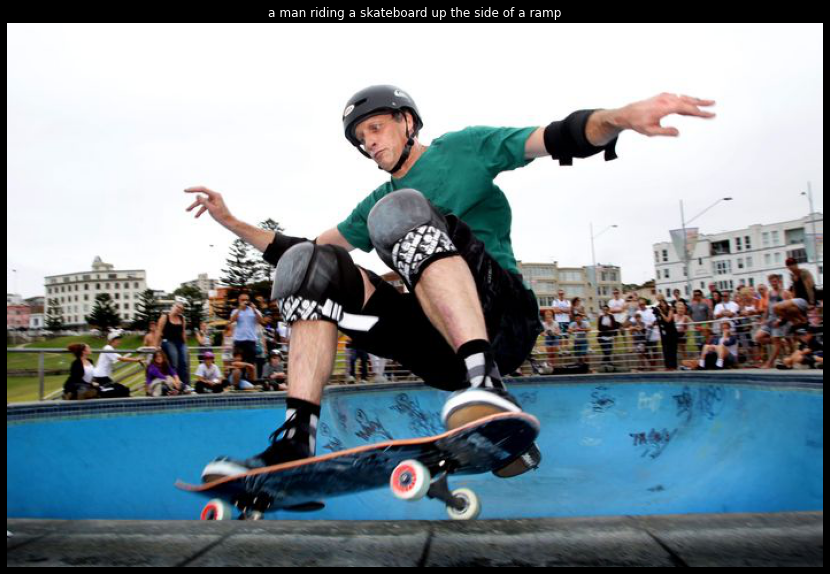

In [ ]:
plt.figure(figsize=(15, 10))
words = [rev_word_map[ind] for ind in seq]
title = ' '.join(words[1:-1])
plt.imshow(np.array(Image.open(img_001)))
plt.title(title)
plt.axis("off")
plt.show()

In [ ]:
all_caps = [[rev_word_map[v] for v in lv] for lv in all]
print("Все варианты:\n")
for sent in all_caps:
  print(" ".join(sent[1:-1]))

Все варианты:

a man riding a skateboard down a ramp
a man riding a skateboard up the side of a ramp
a man riding a skateboard on top of a cement ramp
a young man riding a skateboard up the side of a ramp
a young man riding a skateboard on top of a cement ramp


Здесь все вышло достаточно неплохо. Посмотрим как с другим изображением

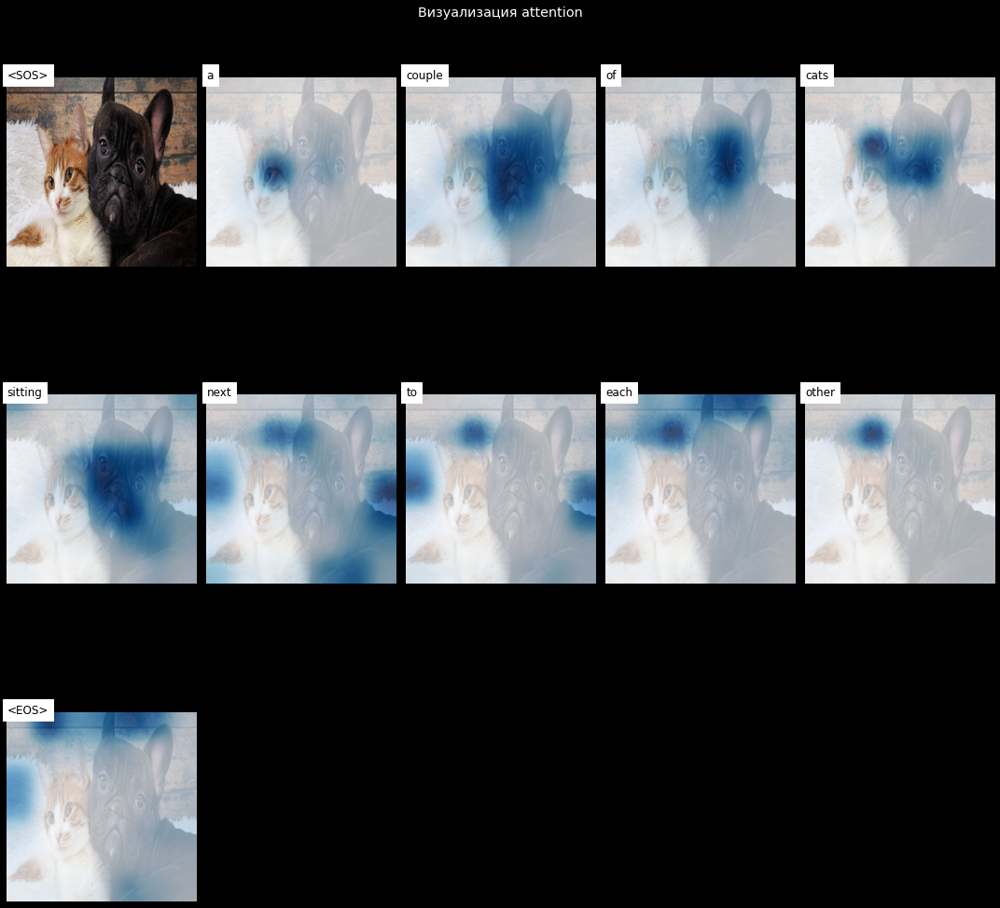

In [ ]:
# смотрим второе изображение
img_002 = "/content/img_002.jpg"
seq, weight, all = generate_caption(encoder, decoder, img_002, word_map, device, beam_size=10)
weight = torch.FloatTensor(weight)

visualize_att(img_002, seq, weight, rev_word_map)

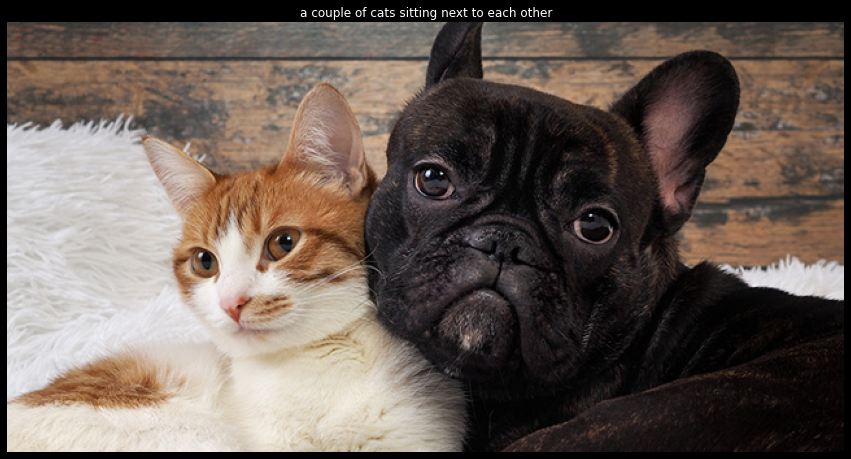

In [ ]:
plt.figure(figsize=(15, 10))
words = [rev_word_map[ind] for ind in seq]
title = ' '.join(words[1:-1])
plt.imshow(np.array(Image.open(img_002)))
plt.title(title)
plt.axis("off")
plt.show()

In [ ]:
all_caps = [[rev_word_map[v] for v in lv] for lv in all]
print("Все варианты:\n")
for sent in all_caps:
  print(" ".join(sent[1:-1]))

Все варианты:

a couple of cats sitting next to each other
a close up of two cats on a bed
a cat and a cat laying on a bed
a close up of a cat and a cat
a couple of cats sitting on top of a bed
a close up of two cats laying on a bed
a close up of two cats sitting on a bed
a close up of a cat laying on a bed
a couple of cats sitting on top of a blanket
a couple of cats sitting next to each other on a bed


А здесь смысл верный, но у нас не пара котов, а собака и кот. Посмотрим на других изображениях - для этого подготовим необхидмые скрипты - чтобы не загромождать ноутбук - добавим кнопку

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Применения на разнообразных изображениях


Для запуска необходимо выполниять ячейку с `process()` и загрузить изображение. Для того, чтобы можно было запустить все независимо - сюда перенем загрузки и назначения всех необходимых объектов - в скрипты переносить не будем - скроем все в выпадющем разделе. Для того, чтобы запустить `process` - просто необходимо выполнить ячейки в скрытом разделе, что подгрузит модели. Раздел ниже свернут - если необходимо поработать с инференсом - просто открываем и запускаем ячейки

### Вспомогательные ячейки - запускать, если нужна независимая работа с данным разделом

Здесь соберем необходимые импорты и загрузки весов. В скрипты оборачивать не стал - чтобы было понимание, что в итоге понадобилось для реализации решения для инференса на случайных изображениях

In [ ]:
# версию пришлось зафиксировать
# в новом релизе сломались веса у энкодера 11 июля 
# обучалось до 11, иначе не загрузить веса
!pip install timm==0.5.4 

In [ ]:
# ниже соберем все необходимое для реализации решения
import json
import timm
import torch
import random
import h5py
import io
import os
import warnings
import ipywidgets as widgets
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch.nn as nn
from pathlib import Path
from PIL import Image
import torchvision.transforms as transforms
from skimage.transform import (
    resize,
    pyramid_expand
)
from glob import glob
from IPython.display import clear_output, display
from tqdm.autonotebook import tqdm
from google.colab import drive, files
import torch.nn.functional as F

import matplotlib.cm as cm

# технические
SEED = random.seed(42)
warnings.filterwarnings("ignore")
plt.style.use('dark_background')

In [ ]:
def convert(img, target_type_min, target_type_max, target_type):
    """приводим к uint8 для сохранения h5py размер 224 на 224"""
    imin = img.min()
    imax = img.max()
    a = (target_type_max - target_type_min) / (imax - imin)
    b = target_type_max - a * imax
    new_img = (a * img + b).astype(target_type)
    return new_img.astype(np.uint8)

Сюда поместим декодер, за ним энкодер отдельной ячейкой

In [ ]:
class Attention(nn.Module):
    """Аттеншн для нашей архитектруы. Используем SoftMax - вероятности станут 
    весами для наших зкодированных пикселей - то есть сумма всех весов будет равна 1
    реализация в TF2 https://towardsdatascience.com/image-captions-with-attention-in-tensorflow-step-by-step-927dad3569fa
    // https://arxiv.org/pdf/2110.11773.pdf Doubly Stohastic Attention"""

    def __init__(self, encoder_dim, decoder_dim, attention_dim):
        super().__init__()
        # преобразовывваем закодированное изображение
        self.encoder_att = nn.Linear(encoder_dim, attention_dim)
        # преобразовываем выходы декодера
        self.decoder_att = nn.Linear(decoder_dim, attention_dim)
        # линейный слой для преобразования в вектор и подачи в SoftMax
        self.full_att = nn.Linear(attention_dim, 1)
        self.relu = nn.ReLU()
        # считаем веса
        self.softmax = nn.Softmax(dim=1)

    def forward(self, encoder_out, decoder_hidden):
        # считаем аттеншн для выходов энкодера и декодера и получаем вектор
        att_enc = self.encoder_att(encoder_out)
        att_dec = self.decoder_att(decoder_hidden)
        att_final = self.full_att(
            self.relu(att_enc + att_dec.unsqueeze(1))).squeeze(2)
        # теперь получаем вероятности, то есть веса
        pxl_weights = self.softmax(att_final)
        # взвешиваем - то есть получаем контекст
        context = (
            encoder_out * pxl_weights.unsqueeze(2)).sum(dim=1)
        return context, pxl_weights


class CaptionNet(nn.Module):

    """RNN на без LSTMCell с Attention"""

    def __init__(self,
                 attention_dim=None,
                 embed_dim=None,
                 decoder_dim=None,
                 vocab_size=None,
                 encoder_dim=1280,
                 dropout=0.5):

        super().__init__()
        # выходе энкодера (B, 14, 14, 1280)
        self.encoder_dim = encoder_dim
        # размерность аттеншн
        self.attention_dim = attention_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        # словарь, подготовленный ранее
        self.vocab_size = vocab_size
        self.dropout = dropout
        # слой аттеншн
        self.attention = Attention(encoder_dim, decoder_dim, attention_dim)
        # эмбеддинги
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=self.dropout)
        # ячейка LSTM https://pytorch.org/docs/stable/generated/torch.nn.LSTMCell.html
        self.decode_step = nn.LSTMCell(
            embed_dim + encoder_dim, decoder_dim, bias=True)
        # инициализация hidden
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        # инициализация cell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        # линейный слой для gate
        self.gate = nn.Linear(decoder_dim, encoder_dim)
        self.sigmoid = nn.Sigmoid()
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.device = torch.device(
            "cuda" if torch.cuda.is_available() else "cpu")
        self.init_weights()

    def init_hidden_state(self, encoder_out):
        """инициализация весов для cell и hidden"""
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)
        c = self.init_c(mean_encoder_out)
        return h, c

    def init_weights(self):
        """иницилиализация весов равномерным распределением для слоя эмбеддингов и fc"""
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, encoder_out, encoded_captions, caption_lengths):

        batch_size = encoder_out.size(0)
        encoder_dim = encoder_out.size(-1)
        vocab_size = self.vocab_size
        # преобразовываем изображение batch x qnt_pixels x encoder_dim
        # (batch_size, num_pixels, encoder_dim)
        encoder_out = encoder_out.view(batch_size, -1, encoder_dim)
        num_pixels = encoder_out.size(1)
        # сортируем данные по длине, по убыванию - понадобится в будущем
        # мы сможем по длине отсекать ине генерировать лишние последовательности
        # во время обучения
        caption_lengths, sort_ind = caption_lengths.squeeze(
            1).sort(dim=0, descending=True)

        encoder_out = encoder_out[sort_ind]
        encoded_captions = encoded_captions[sort_ind]
        # получаем эмбеддинг
        embeddings = self.embedding(encoded_captions)
        # инициализируем веса batch_size, decoder_dim
        h, c = self.init_hidden_state(encoder_out)
        # <EOS> нам не надо кодировать - поэтому из длины мы вычитаем 1
        decode_lengths = (caption_lengths - 1).tolist()

        # создаем тензор, в котором будем хранить информацию о весах и скорах
        predictions = torch.zeros(batch_size, max(
            decode_lengths), vocab_size).to(self.device)
        weights = torch.zeros(batch_size, max(
            decode_lengths), num_pixels).to(self.device)
        for cap in range(max(decode_lengths)):
            # мы можем ограничивать генерацию - ранее отсортировали по длине
            # на инференсе шаг переделаем в beam search
            batch_size_cap = sum([l > cap for l in decode_lengths])
            # взвешиваем эмбеддинг
            attention_weighted_encoding, weight = self.attention(encoder_out[:batch_size_cap],
                                                                  h[:batch_size_cap])
            # находим gate для активации эмбеддинга
            gate = self.sigmoid(self.gate(h[:batch_size_cap]))
            attention_weighted_encoding = gate * attention_weighted_encoding
            # подаем все в декодер
            h, c = self.decode_step(
                torch.cat([embeddings[:batch_size_cap, cap, :],
                          attention_weighted_encoding], dim=1),
                (h[:batch_size_cap], c[:batch_size_cap]))
            # получаем логиты
            preds = self.fc(self.dropout(h))
            # сохраняем логиты и веса по локации метки на данном шаге - тут cap
            # можно t - time-stamp
            predictions[:batch_size_cap, cap, :] = preds
            weights[:batch_size_cap, cap, :] = weight

        return predictions, encoded_captions, decode_lengths, weights, sort_ind

In [ ]:
class EffNet(nn.Module):
    """Encoder на базе efficientnetb0 с заморозкой первых 5 блоков
       Классификационный слой заменен на Identity, pooling на AdaptiveAvgPool2d
    """
    def __init__(self,
                 model_name="efficientnet_b0",
                 blocks_to_retrain=1,
                 frozen=True,
                 encoded_size=14):
        super().__init__()
        # замораживаем или нет
        self.frozen = frozen
        # слои для разморощки
        self.UNFREEZE = ['conv_head', 'act2', 'global_pool', 'classifier']
        # грузим предобученную модель и замораживаем первые блоки
        self.model = self.load_model(model_name, blocks_to_retrain)
        self.model.global_pool = nn.AdaptiveAvgPool2d(
            (encoded_size, encoded_size))
        # классификатор меняем на Identity-слой
        self.model.classifier = nn.Identity()

    # прогоняем изображение и получаем закодированное изображение
    # B x encoded_size x encoded_size x 1280
    def forward(self, x):
        x = self.model(x)
        return x.permute(0, 2, 3, 1)

    # учим только последний блок
    def load_model(self, model_name, blocks_to_retrain):
        count = 0
        # модель грузим из timm-библиотеки
        model = timm.create_model(model_name, pretrained=True)
        # если замораживаем блоки
        if self.frozen:
            for name, block in model.blocks.named_children():
                if count >= (len(model.blocks) - blocks_to_retrain):
                    print(f'Unfreeze block {name}')
                    for pname, params in block.named_parameters():
                        if 'bn' not in pname:
                            params.requires_grad = True
                else:
                    print(f'Keep block {name} frozen')
                count += 1
            for name, child in model.named_children():
                if name in self.UNFREEZE:
                    print(f'Unfreeze block {name}')
                    for params in child.parameters():
                        params.requires_grad == True

        return model

А здесь будут все необходимые загрузки

In [ ]:
%%capture
# веса моделей
!gdown --id 1lMhWUHCmf0a8moC_6sYFrOJGGfFvI-2u
# путь к словарю
!gdown --id 1-RfcFsTRURhKvG9NQP6J9-3laUtpBVxs

И основная функция генерации с `beam_search`

In [ ]:
def generate_caption(encoder, decoder, image_path, word_map, device, beam_size=10):

    k = beam_size
    vocab_size = len(word_map)
    decoder = decoder.to(device)
    encoder = encoder.to(device)
    # читаем изображение
    img = np.array(Image.open(image_path))
    if len(img.shape) == 2:
        img = img[:, :, np.newaxis]
        img = np.concatenate([img, img, img], axis=2)
    # приводим инпут к нашему формату
    img = resize(img, (224, 224))
    img = np.transpose(img, (2, 0, 1))
    img = convert(img, 0, 255, np.uint8)
    img = torch.FloatTensor(img / 255.)
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
    transform = transforms.Compose([normalize])
    image = transform(img)
    # делаем unsqueeze, чтобы добавить размерность батча
    image = image.unsqueeze(0).to(device)
    # кодируем

    with torch.no_grad():

        encoder_out = encoder(image)
        enc_image_size = encoder_out.size(1)
        encoder_dim = encoder_out.size(3)
        # flatten
        encoder_out = encoder_out.view(1, -1, encoder_dim)
        num_pixels = encoder_out.size(1)
        encoder_out = encoder_out.expand(k, num_pixels, encoder_dim)
        # здесь будем хранить k предыдущих слов на каждом шаге - сначала <SOS>
        k_prev_words = torch.LongTensor([[word_map['<SOS>']]] * k).to(device)
        seqs = k_prev_words
        # здесь храним скоры
        top_k_scores = torch.zeros(k, 1).to(device)
        # здесь храним веса из аттенш
        seqs_weights = torch.ones(k, 1, enc_image_size,
                                enc_image_size).to(device)
        # здесь собираем окончательные последовательности
        complete_seqs, complete_seqs_weights, complete_seqs_scores = [], [], []
        # начинаем декодировать
        step = 1
        h, c = decoder.init_hidden_state(encoder_out)
        while True:

            embeddings = decoder.embedding(k_prev_words).squeeze(1)
            context, weights = decoder.attention(encoder_out, h)
            weights = weights.view(-1, enc_image_size, enc_image_size)
            gate = decoder.sigmoid(decoder.gate(h)) # для контекста, у нас LSTMCell
            context = gate * context
            h, c = decoder.decode_step(
                torch.cat([embeddings, context], dim=1), (h, c))

            scores = decoder.fc(h)
            scores = F.log_softmax(scores, dim=1) # log_softmax вместо softmax для beam_search
            scores = top_k_scores.expand_as(scores) + scores

            # на первом шаге скоры все одинаковые
            if step == 1:
                top_k_scores, top_k_words = scores[0].topk(k, 0)
            # дальше уже ищем топ-слова
            else:
                top_k_scores, top_k_words = scores.view(
                    -1).topk(k, 0)
                
            prev_word_idx = top_k_words // vocab_size
            next_word_idx = top_k_words % vocab_size
            # добавляем слова в последовательность
            seqs = torch.cat(
                [seqs[prev_word_idx], next_word_idx.unsqueeze(1)], dim=1)
            seqs_weights = torch.cat([seqs_weights[prev_word_idx], weights[prev_word_idx].unsqueeze(1)],
                                   dim=1)
            # проверяем последовательности, где нет <EOS> - то есть еще не закончены
            incomplete_idx = [ind for ind, next_word in enumerate(next_word_idx) if
                               next_word != word_map['<EOS>']]
            complete_idx = list(
                set(range(len(next_word_idx))) - set(incomplete_idx))
            # откладываем законченные последовательности и уменьшаем bim k
            if len(complete_idx) > 0:
                complete_seqs.extend(seqs[complete_idx].tolist())
                complete_seqs_weights.extend(seqs_weights[complete_idx].tolist())
                complete_seqs_scores.extend(top_k_scores[complete_idx])
            k -= len(complete_idx)
            # работаем с незаконченными последовательностями
            if k == 0:
                break
            seqs = seqs[incomplete_idx]
            seqs_weights = seqs_weights[incomplete_idx]
            h = h[prev_word_idx[incomplete_idx]]
            c = c[prev_word_idx[incomplete_idx]]
            encoder_out = encoder_out[prev_word_idx[incomplete_idx]]
            top_k_scores = top_k_scores[incomplete_idx].unsqueeze(1)
            k_prev_words = next_word_idx[incomplete_idx].unsqueeze(1)
            # если шагов слишком много - заканчиваем
            if step > 42:
                break
            step += 1

        i = complete_seqs_scores.index(max(complete_seqs_scores))
        seq = complete_seqs[i]
        weight = complete_seqs_weights[i]
        return seq, weight, complete_seqs


def visualize_att(image_path, seq, weight, rev_word_map, smooth=True):
    """
    для визуализации аттеншн
    https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb

    """
    fig = plt.figure(figsize=(15, 15))
    image = Image.open(image_path)
    image = image.resize([14 * 20, 14 * 20], Image.LANCZOS)
    words = [rev_word_map[ind] for ind in seq]
    fig.suptitle("Визуализация attention", fontsize="x-large")
    for t in range(len(words)):
        if t > 50:
            break
        plt.subplot(np.ceil(len(words) / 5.), 5, t + 1)
        plt.text(0, 1, '%s' % (words[t]), color='black',
                 backgroundcolor='white', fontsize=12)
        plt.imshow(image)
        cur_weight = weight[t, :]
        if smooth:
            wa = pyramid_expand(cur_weight.numpy(), upscale=20, sigma=12)
        else:
            wa = resize(cur_weight.numpy(), [14 * 20, 14 * 20])
        if t == 0:
            plt.imshow(wa, alpha=0)
        else:
            plt.imshow(wa, alpha=0.72)
        plt.axis('off')
        plt.set_cmap(cm.Blues)
    plt.tight_layout()
    plt.show()

### Применение на изображениях

Теперь мы можем посмотреть, как наше решение справляется со случайными изображениями

-----
<font size=2>Если вы хотите поиграть с моделями - запустите ячейки раздела ВСПОМОГАТЕЛЬНЫЕ ЯЧЕЙКИ </font>

In [ ]:
plt.style.use('dark_background')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = "/content/BEST_checkpoint_coco_5_caps3_wfreq.pth"
beam_size = 3

# подготовим словарь idx2word
word_map_file = "/content/wordmap_coco_5_caps3_wfreq.json"
with open(word_map_file, 'r') as j:
    word_map = json.load(j)
rev_word_map = {v: k for k, v in word_map.items()}

# загрузим модели
checkpoint = torch.load(model, map_location=device)
decoder = checkpoint['decoder']
decoder.eval()
encoder = checkpoint['encoder']
encoder.eval()
# зададим директории входов
input = Path('/content/input')

# для сброса о чистки вывода, после инференса
def reset(p):
  with output_reset:
    clear_output()
  clear_output()
  process()
# кнопки
button_reset = widgets.Button(description="Upload")
output_reset = widgets.Output()
button_reset.on_click(reset)

#основная функция - необходима, для запуска загрузки
def process(upload=True):
  input.mkdir(parents=True, exist_ok=True)
  %cd {input}
  in_files = sorted(glob(f'{input}/*'))
  print('\nНажмите кнопку для загрузки изображения\n')
  if (len(in_files)==0) | (upload):
    # удаляем все что есть внутри
    !rm -rf {input}/*
    uploaded = files.upload()
    if len(uploaded.keys())<=0: 
      print('\nНет файлов для загрузки. Пожалуйста, попробуйте снова...\n')
      return
  # пробегаемся по картинкам и делаем инференс
  in_files = sorted(glob(f'{input}/*'))
  for img in tqdm(in_files):
    seq, _, all= generate_caption(encoder, decoder, img, word_map, device, beam_size)
    plt.figure(figsize=(15, 10))
    words = [rev_word_map[ind] for ind in seq]
    title = ' '.join(words[1:-1])
    plt.imshow(np.array(Image.open(img)))
    plt.title(title)
    plt.axis("off")
    all_caps = [[rev_word_map[v] for v in lv] for lv in all]
    print("Все варианты:\n")
    for sent in all_caps:
      print(" ".join(sent[1:-1]))

/content/input

Нажмите кнопку для загрузки изображения



Saving photo_2022-07-04_19-50-18.jpg to photo_2022-07-04_19-50-18.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

Все варианты:

a group of people riding bikes down a street
a group of people riding bicycles down a street
a group of people riding bikes down the street


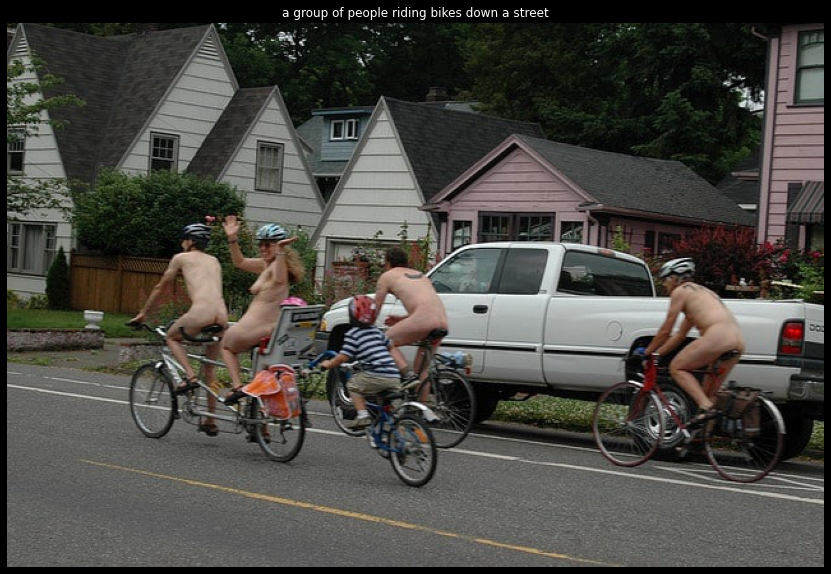

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

Это изображение было найдено в `COCO_val_2017` - всегда было интересно, что здесь происходит

/content/input

Нажмите кнопку для загрузки изображения



Saving Superman_and_Batman.jpg to Superman_and_Batman.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

Все варианты:

a couple of women standing next to each other
a couple of people standing next to each other
a couple of women that are standing next to each other


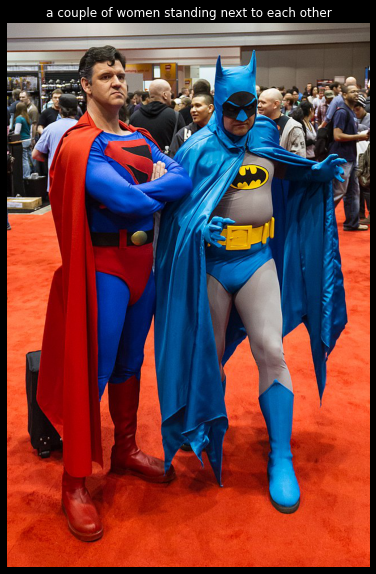

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

Или так...костюмы :)) Тут бы лучше подошло `a couple of people standing next to each other`

/content/input

Нажмите кнопку для загрузки изображения



Saving boat.jpg to boat.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

Все варианты:

a large boat with a lot of people on it
a large boat with a lot of people in it
a large boat with a lot of people on it in the water


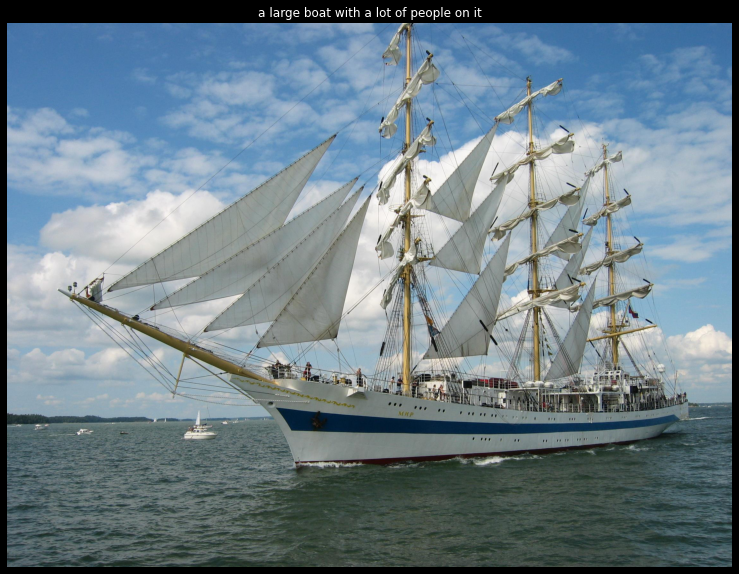

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

А здесь - все достаточно неплохо

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Вывод


По окончанию первого этапа работы мы смогли подготовить датасет для обучения архитектуры для задачи `Image captioning`. Мы использовали тренировочные, проверочные и тестовые сплиты Андрея Карпати вместе с датасетом `MSCOCO'2014`. Сделали предобработку: добавить паддинги <SOS> и <EOS>, чтобы обозначать начало и конец последовательности. Реализовали `datapipeline` для предобработки аннотаций и изображения - на выходе получили несколько методов и классов для работы с данной задачей. 

Мы подготовили `encoder` на базе `efficient-netb0` и дотюнили его на `COCO-датасете`, подготовили простую RNN на базе одной `LSTM-ячейки`. Также реализовали `soft-attention`

Результаты вышли приемлемые. На инференесе попадатся ошибки, но в целом для такой простой архитектуры - качество удовлетворительное

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Раздел II

Второй раздел посвящен проработке базового ноутбука - обучению только декодера, энкодер берем ранее подготовленный командой [`DLS`](#https://www.dlschool.org/)  

План работы:


1. Скачаем датасет (векторы изображений `R = 2048` и соответствующие описания) и предобработаем описания.  
2. В качестве сети возьмем `InceptionV3` и скачаем к ней предобученные веса.
3. Напишем вторую сеть, которая будет брать векторы из Inception-v3 и генерить описания.
4. Обучим вторую сеть на `MSCOCO`

____
<font size=2>
Стоит отметить, что изначально все было проще - но в таком пайплайне не получались хорошие описания. В поиск ошибок - был переделан и усложнен пайплайн - в итоге - оказалось, что ошибка была в сплите на трейн и тест - перемешаны эмбеддинги - в итоге - пайплайн оставлен в таком виде, с `greedy search`</font>

### 1. Импорты

Здесь для удобства оберем все импорты. В дальнейшем, для удобства ознакомления с работой - новые методы и классы будут появляться в своих разделах.

In [ ]:
%%capture
!gdown --id 1BCHgtAgqYJcyyCf_6Zb8Y9E_p0HbtXuz

In [ ]:
import json
import torch
import random
import io
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch.nn as nn
import pandas as pd
import heapq
import ipywidgets as widgets
from pathlib import Path
from PIL import Image
from imageio import imread
from torch.utils.data import (
    Dataset,
    DataLoader
)
import cv2
import torchvision.transforms as transforms
from skimage.transform import (
    resize,
    pyramid_expand
)
from tqdm.autonotebook import tqdm
from torch.nn.utils.rnn import pack_padded_sequence
from collections import Counter
from google.colab import drive, files
from glob import glob
from nltk import WordPunctTokenizer
import torch.nn.functional as F
from nltk.translate.bleu_score import corpus_bleu
from beheaded_inception3 import beheaded_inception_v3 # подготовлено DLS https://www.dlschool.org/

# технические
SEED = random.seed(42)
warnings.filterwarnings("ignore")
plt.style.use('dark_background')

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%%capture
# подготовлено DLS
# предобученные эмбеддинги и подготовленные изображения
!unzip "/content/drive/MyDrive/Diploma_spring/data.zip" -d "/content/data_pretrain" 

In [ ]:
def findexact(lst):
    """дя удаления PAD и EOS"""
    key = [11568, 0, 11385]
    for idx, elem in enumerate(lst):
        if any(item == elem for item in key):
            return idx

Все скачалось - можем загрузить датасет

In [ ]:
# загружаем датасет
img_codes = np.load("/content/data_pretrain/data/image_codes.npy")
captions = json.load(open('/content/data_pretrain/data/captions_tokenized.json'))

Данные успешно загружены - необходимо их подготовить для обучения и работы. Приступим в дальнейших шагах

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### 2. Подготовка данных

Посмотрим, с чем нам предстоит работать и в каком виде получили наши данные

In [ ]:
# посмотрим на датасет
print("Каждое изображение представлено в виде эмбеддинга размерностью %s" % str(img_codes.shape))
print(img_codes[0,:10], end='\n\n')
print("Для каждого изображения имеется описания:\n")
print('\n'.join(captions[0]))

Каждое изображение представлено в виде эмбеддинга размерностью (118287, 2048)
[0.3659946  0.2016555  0.9245725  0.57063824 0.547268   0.8275868
 0.3687277  0.12085301 0.0561931  0.49758485]

Для каждого изображения имеется описания:

people shopping in an open market for vegetables .
an open market full of people and piles of vegetables .
people are shopping at an open air produce market .
large piles of carrots and potatoes at a crowded outdoor market .
people shop for vegetables like carrots and potatoes at an open air market .


Как можно видеть, в датасете все `captions` (тексты-описания) уже токенизированы и приведены в нижний регистр. Нам осталось сделать следующее:

1. Добавить ко всем описаниям символы начала и конца предложения, паддинги и неизвестные слова - `<SOS>, <EOS>, <PAD>, <UNK>`
2. Посчитать частоту встречания каждого слова из словаря и оставить тольео те, которые встречаются больше N раз - используем `Counter`
3. Создать словарь из оставшихся слов и символов начала, конца предложения и `<PAD>` символа - `idx2word`-словрь
4. Подготовить датасет, который мы подадим в `dataloader`
5. Поделить выборку на train/test

Для начала добавим символы конца предложений

In [ ]:
# минимальное вхождение слова для словаря
MIN_FREQ = 3
OUTPUT = "/content/drive/MyDrive/Diploma_spring/baseline"
# создаем токенайзер, перебираем описания и собираем словарь
tokenizer = WordPunctTokenizer()
word_freq = Counter()
# вспомогательный список для последующей аналитики
analytics = []
for ids in tqdm(range(len(captions))):
  for seq in captions[ids]:
    tokens = tokenizer.tokenize(seq)
    word_freq.update(tokens)
    analytics.append(len(tokens))
# чистим словарь от слов с вхождением меньше 3
words = [w for w in word_freq.keys() if word_freq[w] > MIN_FREQ]
word_map = {k: v + 1 for v, k in enumerate(words)}
# добавляем служебные слова
word_map['<UNK>'] = len(word_map) + 1
word_map['<SOS>'] = len(word_map) + 1
word_map['<EOS>'] = len(word_map) + 1
word_map['<PAD>'] = 0
# сохраним на диск для последующей загрузки
with open(os.path.join(OUTPUT, 'wordmap' + '.json'), 'w') as j:
    json.dump(word_map, j)

  0%|          | 0/118287 [00:00<?, ?it/s]

Посмотрим топ слов. Артикулы и короткие слова решили не исключать, будет качественнее описание, но при этом - вероятно, тяжелее все будет обучаться и станет переобучиваться на какие то слова - поэтому мы увелими обучающую выборку до `95%` и поставим небольшое количество эпох. Получим некоторое подобие `online-learning`

In [ ]:
# топ слов
word_freq.most_common()[:15]

[('a', 978142),
 ('.', 444811),
 ('on', 215566),
 ('of', 203951),
 ('the', 197678),
 ('in', 184071),
 ('with', 154714),
 ('and', 140855),
 ('is', 98139),
 ('man', 73298),
 ('to', 68129),
 ('sitting', 52883),
 ('an', 49849),
 ('two', 48383),
 (',', 44448)]

Теперь нам необходимо пройтись по нашим описаниям и подготовить данные для обучения - закодировать слова, добавить паддинги. Для того, чтобы определиться с максимальной длиной - посмотрим гистограмму распределения возрастов в нашей выборке

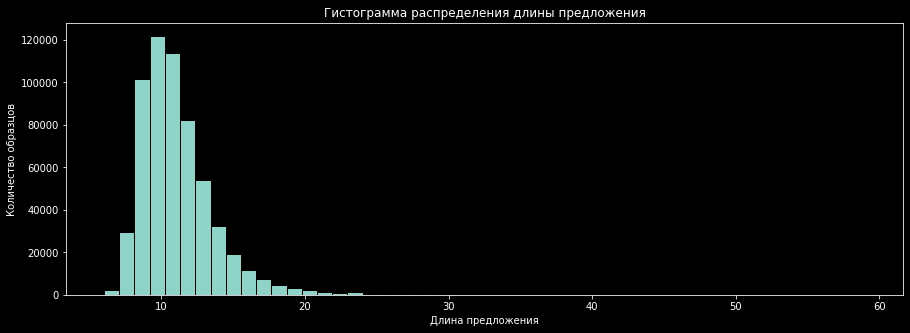

In [ ]:
data = pd.Series(analytics)
plt.figure(figsize=(15, 5))
data.hist(bins=50, ec='black')
plt.grid(False)
plt.xlabel("Длина предложения")
plt.ylabel("Количество образцов")
plt.title("Гистограмма распределения длины предложения")
plt.show()

И дополним анализ основной информацией по длине - среднее, медиана, стандартное отклонение и квартили

In [ ]:
data.describe().to_frame("Значения")

,Значения
count,591435.000000
mean,11.337073
std,2.631381
min,6.000000
25%,10.000000
50%,11.000000
75%,12.000000
max,59.000000


Как мы видим, максимальная длина предложения в сете - 59 токенов. Будем ограничивать длину числом `60`. До этой длины предложения будем добивать токеном `<PAD>`. Для удобства - соберем списки и сохраним в виде `json`-файлов. Загрузим на диск и будем считывать при обучении, чтобы в будущем не пришлось снова подготовливать данные

In [ ]:
total_caps = []
total_lens = []
CAPTIONS_PER_IMAGE = 5
OUTPUT = "/content/drive/MyDrive/Diploma_spring/baseline"
# определим максимальную длину
# все что свыше - будем паддить
MAX_LEN = 60
all_tokens = []
tokenizer = WordPunctTokenizer()
for idx, sub_caption in enumerate(captions):
  cap_tokens = []
  for cap in sub_caption:
    tokens = tokenizer.tokenize(cap)
    cap_tokens.append(tokens)
  all_tokens.append(cap_tokens)


# теперь соберем к каждому эмбеддингу его 5 описаний
enc_captions = []
caplens = []			
for i, embd in enumerate(tqdm(img_codes)):
  # проверяем, возможно не у всех картинок по 5 описаний
  if len(all_tokens[i]) < CAPTIONS_PER_IMAGE:
      caps = all_tokens[i] + [random.choice(all_tokens[i])
                            for _ in range(CAPTIONS_PER_IMAGE - len(all_tokens[i]))]
  else:
      caps = random.sample(all_tokens[i], k=CAPTIONS_PER_IMAGE)
  for idx, c in enumerate(caps):
    enc_c = [word_map['<SOS>']] + [word_map.get(word, word_map['<UNK>']) for word in c] + [
      word_map['<EOS>']] + [word_map['<PAD>']] * (MAX_LEN - len(c))  # собираем наши текстовые описания со спец. токенами                                                                                   
    c_len = len(c) + 2
    enc_captions.append(enc_c)
    caplens.append(c_len)

# проверяем	
assert len(img_codes) * \
                CAPTIONS_PER_IMAGE == len(enc_captions) == len(caplens)

# сохраняем все в json на диск
with open(os.path.join(OUTPUT, 'caps' + '.json'), 'w') as idx:
    json.dump(enc_captions, idx)
with open(os.path.join(OUTPUT, 'caps_len' + '.json'), 'w') as idx:
    json.dump(caplens, idx)

  0%|          | 0/118287 [00:00<?, ?it/s]

Все сохранилось, теперь на базе этих `json`-файлов - сделаем датасеты и зададим `dataloader`. Единственное - нам необходимо будет разделить выборку на валидационную и обучающую. Напишем свою функцию и разделим списки данных по индексам

In [ ]:
def split_train_test(img_codes, caps, caps_len, test_size, caps_per_img=5):
    """дял разделения сета"""
    # создаем словарь сетов
    dataset = {"train": {"images": [], "caps": [], "caps_len": []}, 
               "test": {"images": [], "caps": [], "caps_len": []}
               }

    # перемешиваем индексы
    shuffled_idx = np.random.permutation(len(img_codes))
    # опредяляем тест
    test_size = int(len(img_codes) * test_size)
    subset = ["train", "test"]
    # собираем сет
    for sub in subset:
      # делим выборки и получим сплиты на train и test - это понадобится для датасета
      if sub is "train":
          # обучающая
          train = shuffled_idx[test_size:].astype(int)
          dataset[sub]["images"] = img_codes[train]
          for idx in train:
            # 1 индекс картинки == 5 индексам описаний
            ids = idx * caps_per_img
            captions = caps[ids:ids + caps_per_img] 
            cap_lens = caps_len[ids:ids + caps_per_img] 
            dataset[sub]["caps"].extend(captions)
            dataset[sub]["caps_len"].extend(cap_lens) 
      else:
          #валидационная/тест
          test = shuffled_idx[:test_size].astype(int)
          dataset[sub]["images"] = img_codes[test]
          for idx in test:
            # 1 индекс картинки == 5 индексам описаний
            ids = idx * caps_per_img
            captions = caps[ids:ids + caps_per_img]
            cap_lens = caps_len[ids:ids + caps_per_img] 
            dataset[sub]["caps"].extend(captions)
            dataset[sub]["caps_len"].extend(cap_lens) 
          assert len(dataset[sub]["caps"]) == len(dataset[sub]["images"]) * 5
    return dataset

Для спокойствия - подгрузим данные, которые сохранили ранее, не будем брать созданные переменные - пересоздадим все

In [ ]:
DATA_FOLDER = Path("/content/drive/MyDrive/Diploma_spring/baseline")
# грузим все наши данные
wordmap_path = DATA_FOLDER / Path("wordmap.json")
caps_path = DATA_FOLDER / Path("caps.json")
caps_len_path = DATA_FOLDER / Path("caps_len.json")
# подгружаем
with open(caps_path, 'r') as j:
    caps = json.load(j)
with open(caps_len_path, 'r') as j:
    caps_len = json.load(j)
with open(wordmap_path, 'r') as j:
    wordmap = json.load(j)

Проверим

In [ ]:
rev_word_map = {v: k for k, v in wordmap.items()}
# очистим последовательность
seq = caps[0]
end = findexact(seq)
seq = seq[:end]
seq = " ".join([rev_word_map[v] for v in seq[1:]])
assert seq == "an open market full of people and piles of vegetables ."

Разделим выборку, потом по этим индексам соберем финальные сеты для нашего датасета в `torch`. Сделаем два сабсета - валидационынй и обучающий. 

In [ ]:
# делим датасет. Тест сделаем небольшой, чтобы больше образцов получить
dataset = split_train_test(img_codes, caps, caps_len, test_size=.05) 

Получили словарь с двумя ключами - `train` и `test` - теперь необходимо подготовить Dataset для загрузчика и мы можем приступать к подготовке модели

In [ ]:
class CaptionDataset(Dataset):

    """Датасет для нашей задачи"""

    def __init__(self, data, split):
        self.split = split
        assert self.split in {'train', 'test'}
        self.train = data["train"]
        self.test = data["test"]
        self.CAPTIONS = 5
        if self.split in 'train':
          self.dataset_size = len(data["train"]["images"])
        else:
          self.dataset_size = len(data["test"]["images"])
    
    def __getitem__(self, ids):
        # у изображения может быть несколько описаний - это надо учитывать при обращении к индексы
        if self.split in 'train':
          encoder_out = self.train["images"][ids // self.CAPTIONS]
          # подаем рандомное описание
          caption = torch.LongTensor(self.train["caps"][ids])
          caplen = torch.LongTensor([self.train["caps_len"][ids]])
          return encoder_out, caption, caplen
        # если вылидируемся - будем возвращать еще и все описания - для того чтобы посчитать BLEU
        else:
            encoder_out = self.test["images"][ids // self.CAPTIONS]
            caption = torch.LongTensor(self.test["caps"][ids])
            caplen = torch.LongTensor([self.test["caps_len"][ids]])
            # для подсчета bleu4. Текущий индекс + шаг self.CAPTIONS
            all_captions = torch.LongTensor(
                self.test["caps"][((ids // self.CAPTIONS) * \
                               self.CAPTIONS):(((ids // self.CAPTIONS) * \
                                                    self.CAPTIONS) + self.CAPTIONS)])
            return encoder_out, caption, caplen, all_captions

    def __len__(self):
        return self.dataset_size

Теперь протестируем, что у нас все работает как задумано

In [ ]:
# задаем даталоадер, тестовый, чтобы проверить все последовательности
batch_size = 5
test_loader = DataLoader(
              CaptionDataset(dataset,
                            'test'),
              batch_size=batch_size, shuffle=True, num_workers=0)

# получаем батч
img, caption, caplen, all = next(iter(test_loader))
assert img.shape[1] == 2048
print(f"Размерность эмбеддинга из энкодера - {img.shape[1]}")
rev_word_map = {v: k for k, v in wordmap.items()}

Размерность эмбеддинга из энкодера - 2048


In [ ]:
# расшифровка
batch_idx = np.random.randint(batch_size)
seq = caption[batch_idx].numpy().tolist()[1:]
end = findexact(seq)
seq = seq[:end]
seq = " ".join([rev_word_map[v] for v in seq])
print("Последовательность батча\n")
print(seq, end="\n\n")
# все последовательности
all_caps = all.tolist()[batch_idx]
print("Все варианты:\n")
for sent in all_caps:
  end = findexact(sent)
  sent = sent[:end]
  print(" ".join([rev_word_map[v] for v in sent[1:]]))  

Последовательность батча

a man eating a hamburger , and a woman eating a hold dog on a bench .

Все варианты:

a man eating a hamburger , and a woman eating a hold dog on a bench .
a man with a balding head eating food with a hot bikini babe .
people in bathing suits enjoying barbecue foods
a couple eating hamburgers and hotdogs at a pool party
a man eating a burger and a woman eating a hot dog


In [ ]:
# задаем даталоадер, тестовый, чтобы проверить все последовательности
batch_size = 5
train_loader = DataLoader(
              CaptionDataset(dataset,
                            'train'),
              batch_size=batch_size, shuffle=True, num_workers=0)

# получаем батч
img, caption, caplen = next(iter(train_loader))
assert img.shape[1] == 2048
print(f"Размерность эмбеддинга из энкодера - {img.shape[1]}")
rev_word_map = {v: k for k, v in wordmap.items()}
# расшифровка
batch_idx = np.random.randint(batch_size)
seq = caption[batch_idx].numpy().tolist()[1:]
end = findexact(seq)
seq = seq[:end]
seq = " ".join([rev_word_map[v] for v in seq])
print("Последовательность батча\n")
print(seq, end="\n\n")

Размерность эмбеддинга из энкодера - 2048
Последовательность батча

many books have been stacked high in the corner of a room .



Датасет и даталоадер работают. Мы можем приступать к подготовке архитектры декодера. Каждому изображению соответствует 5 описаний

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### 2. RNN для вывода описания


Теперь необходимо подготовить декодер. Сделаем простой, без `attention`, учить будем только его, за нас уже обучили эмбеддинги. В будущем - убдем просто подавать изображение на вход нашей `CNN`, и получать на выходе векторное представление как вход для нашего декодера

<p align="center"><img src="https://drive.google.com/uc?id=1IKBieXmYs6C4UJ-XutFcyc-vwhRoi4Jl"  border="0"></a></p>


Здесь также возьмем `LstmCell`. Изначально работали с `LSTM` - но в таком виде - выходит лучше описание. Потом будем перебирать метки, и предсказывать на основе эмбеддинга и предказаний прошлого шага. 


[Ссылка](#https://medium.com/@kion.kim/lstm-vs-lstmcell-and-others-on-gluon-aac33f7b54ea#:~:text=LSTMCell%20is%20useful%20when%20we,at%20the%20previous%20time%20step.&text=Due%20to%20this%20difference%2C%20LSTM,for%20information%20about%20time%20step)

In [ ]:
class CaptionNet(nn.Module):

    """
    Apply the network in training mode.
    :param image_vectors: torch tensor, содержащий выходы inseption. Те, из которых будем генерить текст
            shape: [batch, cnn_feature_size]
    :param captions_ix:
            таргет описания картинок в виде матрицы
    :returns: логиты для сгенерированного текста описания, shape: [batch, word_i, n_tokens]

    Обратите внимание, что мы подаем сети на вход сразу все префиксы описания
    и просим ее к каждому префиксу сгенерировать следующее слово!
    """

    def __init__(
        self,
        embed_dim=None,
        decoder_dim=None,
        vocab_size=None,
        encoder_dim=2048,
        dropout=0.5
    ):
        super().__init__()
        # стандартная архитектура такой сети такая:
        # 1. линейные слои для преобразования эмбеддиинга картинки в начальные состояния h0 и c0 LSTM
        # 2. слой эмбедднга
        # 3. LSTM слои
        # 4. линейный слой для получения логитов
        # выходе энкодера (B, 2048)
        self.encoder_dim = encoder_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        # словарь, подготовленный ранее
        self.vocab_size = vocab_size
        self.dropout = dropout
        # слой эмбеддингов
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=self.dropout)
        # ячейка LSTM - всю брать не стал - нам нужно в конкретный момент времени
        # получить конкретный ответ, достаточно взять ячейку показалось
        # так оказалось легче делать beam search
        self.decode_step = nn.LSTMCell(
            embed_dim, decoder_dim, bias=True
        )
        # инициализация hidden
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        # инициализация cell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.init_weights()

    def init_hidden_state(self, image_vectors):
        """инициализация весов для cell и hidden"""
        image_vectors = image_vectors.mean(dim=1)
        h = self.init_h(image_vectors)
        c = self.init_c(image_vectors)
        return h, c

    def init_weights(self):
        """иницилиализация весов равномерным распределением для слоя эмбеддингов и fc"""
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, image_vectors, captions_ix, caption_lengths):
        batch_size = image_vectors.size(0)
        encoder_dim = image_vectors.size(-1)
        image_vectors = image_vectors.unsqueeze(1)
        image_vectors = image_vectors.view(batch_size, 1, encoder_dim)
        # сортируем данные по длине, по убыванию - понадобится в будущем
        # мы сможем по длине отсекать ине генерировать лишние последовательности
        # во время обучения
        caption_lengths, sort_idx = caption_lengths.squeeze(1).sort(
            dim=0, descending=True
        )
        image_vectors = image_vectors[sort_idx]
        captions_ix = captions_ix[sort_idx]
        # инициализируем LSTM state
        h, c = self.init_hidden_state(image_vectors)
        # применим слой эмбеддингов к image_vectors
        # (batc, cap_len, embd_dim)
        embeddings = self.dropout(self.embedding(captions_ix))
        # скормим LSTM embeddings
        # при этом не будем передавать <EOS> в декодер
        # мы ранее сохраняли информацию о длине последовательности
        # поэтому фактическая длина будет сохраненная - 1
        decode_lengths = (caption_lengths - 1).tolist()
        # создаем тензор-хранилище
        predictions = torch.zeros(batch_size, max(decode_lengths), self.vocab_size).to(
            self.device
        )
        # перебираем time-stamps
        for t in range(max(decode_lengths)):
            # ограничиваем - мы ранее сортировали, теперь генерируем только там, где необходимо
            # на инференсе шаг будет выполнен иначе - в виде жадного поиска
            batch_size_cap = sum([l > t for l in decode_lengths])
            # на каждом time-stemp мы используем hidden и cell с предыдущего шага
            h, c = self.decode_step(
                embeddings[:batch_size_cap, t, :],
                (h[:batch_size_cap], c[:batch_size_cap]),
            )
            # предсказания каждого шага - логиты
            preds = self.fc(self.dropout(h))
            # добавляем к общему тензору
            predictions[:batch_size_cap, t, :] = preds
        return predictions, captions_ix, decode_lengths, sort_idx

Архитектура нашего декодера готова, она достаточно простая и будет возвращать нам помимо самих логитов - еще и дополнительную информацию, которую мы будем использовать для подсчета производительности модели в процессе обучения

In [ ]:
# зададим параметры и попробуем получать какой то выход
# подав dummy-input
embed_dim = decoder_dim = 512
vocab_size = len(wordmap)
# RNN
decoder = CaptionNet(
                     embed_dim=embed_dim,
                     decoder_dim=decoder_dim,
                     vocab_size=vocab_size
                     )

# проверка на dummy-ecnode
dummy = torch.randn(batch_size, 2048)
decoder.eval()
with torch.no_grad():
    scores, caps_sorted, decode_lengths, sort_ind = decoder(image_vectors=dummy, 
                  captions_ix=caption,
                  caption_lengths=caplen
                  )

Все отлично отработало. Декодер работает, выдает, что нам требуется - будем приступать к написанию `loss`-функции и вспомогательных функций для обучения

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


## Подготовка к обучению

Подготовим вспомогательные функции, для обучения. Аналогичные представлены в разделе I за одним исключением - теперь мы не учим энкодер - только декодер. Функции отдельно комментировать не будем в `markdown` - оставим комментарии в самом коде. 

In [ ]:
def compute_loss(criterion, scores, targets, decode_lengths):
    # упаковываем, используя данные о длине (чтобы убрать временные метки, которые мы не кодировали)
    # ранее мы останавливали кодировку законченных последовательностей
    scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
    targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
    # считаем лосс
    # модель выдает предсказания с учетом time-stamps
    # сюда передаем уже общие скоры
    # в scores уже собраны оценки для наших последовательностей, для всех слов
    loss = criterion(scores, targets)
    return loss

In [ ]:
def accuracy(scores, targets, k = 3):
    """
    считаем top_k accuracy
    """
    batch_size = targets.size(0)
    _, idx = scores.topk(k, 1)
    correct = idx.eq(targets.view(-1, 1).expand_as(idx))
    correct_total = correct.view(-1).float().sum()
    return correct_total.item() * (100.0 / batch_size)

In [ ]:
class Metrics(object):
    """вспомогательная, чтобы не нагромождать код"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [ ]:
def save_checkpoint(epoch, epochs_since_improvement, 
                    decoder, decoder_optimizer,
                    bleu4, is_best):

    state = {'epoch': epoch,
             'epochs_since_improvement': epochs_since_improvement,
             'bleu4': bleu4,
             'decoder': decoder,
             'decoder_optimizer': decoder_optimizer}
    filename = 'baseline' + '.pth'
    torch.save(state, filename)
    if is_best:
        torch.save(state, 'BEST_' + filename)

Теперь подготовим функции обучения и валидации

In [ ]:
def train(train_loader, decoder, criterion, 
          decoder_optimizer, epoch, device, clip, verbose):
    # обучающая
    losses = Metrics()
    top5accs = Metrics()
    
    iter_losses = []

    decoder.train()

    for idx, (image_vectors, captions_ix, caplens) in enumerate(train_loader):
        image_vectors = image_vectors.to(device)
        captions_ix = captions_ix.to(device)
        caplens = caplens.to(device)
       
        scores, caps_sorted, decode_lengths, sort_ind = decoder(
            image_vectors, captions_ix, caplens)
        # считаем после токена <SOS> и до <EOS>
        targets = caps_sorted[:, 1:]
        loss = compute_loss(criterion, scores, targets, decode_lengths)

        decoder_optimizer.zero_grad()
        loss.backward()
        # clip grad
        torch.nn.utils.clip_grad_norm_(decoder.parameters(), clip)
        decoder_optimizer.step()
        # cобираем метрики
        scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
        targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
        top5 = accuracy(scores, targets, 5)
        losses.update(loss.item(), sum(decode_lengths))
        top5accs.update(top5, sum(decode_lengths))
        iter_losses.append(losses.avg)
        if idx % verbose == 0 or idx == len(train_loader):
            print('Эпоха: [{0}][{1}/{2}]\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                  'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})'.format(epoch + 1, idx, len(train_loader),
                                                                          loss=losses,
                                                                          top5=top5accs))
    return iter_losses

In [ ]:
def validate(val_loader, decoder, criterion, device, verbose):
    # для валидации
    iter_losses = []
    decoder.eval()
    rev_word_map = {v: k for k, v in wordmap.items()}
    losses = Metrics()
    top5accs = Metrics()
    references, hypotheses = [], []
    with torch.no_grad():
        for idx, (image_vectors, captions_ix, caplens, allcaps) in enumerate(val_loader):
            image_vectors = image_vectors.to(device)
            captions_ix = captions_ix.to(device)
            caplens = caplens.to(device)
            scores, caps_sorted, decode_lengths, sort_ind = decoder(
                image_vectors, captions_ix, caplens)
            # считаем после токена <SOS> 
            targets = caps_sorted[:, 1:]
            loss = compute_loss(criterion, scores, targets, decode_lengths)
            score_res = scores.clone()
            # cобираем метрики
            scores = pack_padded_sequence(scores, decode_lengths, batch_first=True).data
            targets = pack_padded_sequence(targets, decode_lengths, batch_first=True).data
            top5 = accuracy(scores, targets, 5)
            losses.update(loss.item(), sum(decode_lengths))
            top5accs.update(top5, sum(decode_lengths))
            iter_losses.append(losses.avg)
            if idx % verbose == 0 or idx == len(val_loader):

                print('Validation: [{0}/{1}]\t'
                      'Loss {loss.val:.4f} ({loss.avg:.4f})\t'
                      'Top-5 Accuracy {top5.val:.3f} ({top5.avg:.3f})\t'.format(idx, len(val_loader),
                                                                              loss=losses, top5=top5accs))
            # подтянем все captions, что мы сохраняли для каждого изображения
            allcaps = allcaps[sort_ind]
            for j in range(allcaps.shape[0]):
                img_caps = allcaps[j].tolist()
                img_captions = list(
                    map(lambda c: [w for w in c if w not in {wordmap['<SOS>'], wordmap['<PAD>']}],
                        img_caps))  # убираем <SOS> and <PAD>
                        
                img_captions = [[rev_word_map[v] for v in lv] for lv in img_captions]  # приводим к словам
                references.append(img_captions)

            # предсказания - берем максимальные по каждому предсказанию
            # и вытаскиваем индексы
            _, preds = torch.max(score_res, dim=2)
            preds = preds.tolist()
            temp_preds = []
            for j, p in enumerate(preds):
                # убираем <PAD>
                temp_preds.append(preds[j][:decode_lengths[j]])
            preds = temp_preds
            preds = [[rev_word_map[v] for v in lv] for lv in preds] # приводим к словам
            hypotheses.extend(preds)
            assert len(references) == len(hypotheses)

        bleu4 = corpus_bleu(references, hypotheses) * 100

        print(
            '\n * Loss - {loss.avg:.3f}, top-5 Accuracy - {top5.avg:.3f}, bleu-4 - {bleu}\n'.format(
                loss=losses,
                top5=top5accs,
                bleu=bleu4))

    return bleu4, iter_losses

In [ ]:
def fit(wordmap,
        batch_size,
        decoder,
        criterion,
        verbose,
        patience,
        epochs,
        decoder_optimizer,
        clip):

    # создаем вспомогательные списки и переменные
    train_loss = []
    val_loss = []
    best_bleu4 = 0
    wait = 0

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    decoder.to(device)
    rev_word_map = {v: k for k, v in wordmap.items()}
    # модели отправляем на device
    # задаем даталоадер train и val
    train_loader = DataLoader(
              CaptionDataset(dataset,
                            'train'),
              batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(
              CaptionDataset(dataset,
                            'test'),
              batch_size=batch_size, shuffle=True, num_workers=0)
    # учим N epochs
    for epoch in range(epochs):
        # это ранняя остановка
        if wait == patience:
            break
        # находим метрики на обучении
        train_losses = train(train_loader=train_loader,
                             decoder=decoder,
                             criterion=criterion,
                             decoder_optimizer=decoder_optimizer,
                             epoch=epoch,
                             device=device,
                             clip=clip,
                             verbose=verbose)

        train_loss.append(np.mean(train_losses))
        # теперь находим метрики на валидации
        recent_bleu4, val_losses = validate(val_loader=val_loader,
                                            decoder=decoder,
                                            criterion=criterion,
                                            device=device, verbose=verbose)

        val_loss.append(np.mean(val_losses))
        # смотрим по bleu4, когда останавливаться
        is_best = recent_bleu4 >= best_bleu4
        best_bleu4 = max(recent_bleu4, best_bleu4)
        if not is_best:
            wait += 1
        else:
            wait = 0
        # сохраняем модель
        save_checkpoint(epoch, patience, decoder, decoder_optimizer, recent_bleu4, is_best)

    return train_loss, val_loss

Все готово, можем приступать к обучению. По результам у нас есть все необходимое, чтобы мы могли пробовать обучать нашу архитектуру

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


## Обучение

Идея в следующем...чтобы не позволить переобучать на слова - увеличиваем обучающую выборку, но сильно сменьшаем количество эпох. В данном варианте - `5 эпох на 95% выборки`. Через сеть пройдет около `100 000 тысяч` описаний для обучения - поэтому уменьшим количество эпох, чтобы не допустить переобучения. Если гнаться за `bleu4` - получим в итоге плохие описания (здесь можно получить `21 bleu4`)

In [ ]:
DATA_FOLDER = Path("/content/drive/MyDrive/Diploma_spring/baseline")
# подгружаем idx2word словарь
wordmap_path = DATA_FOLDER / Path("wordmap.json")
with open(wordmap_path, 'r') as j:
  wordmap = json.load(j)
# задаем основные параметры
batch_size = 128
embed_dim = 512
decoder_dim = 512
vocab_size = len(wordmap)
verbose = 500
epochs = 5 # выше - переобучается на man - увеличим train и сделаем меньше эпох
clip = 1
patience = 3

# создаем модели и оптимизаторы
decoder = CaptionNet(
                     embed_dim=embed_dim,
                     decoder_dim=decoder_dim,
                     vocab_size=vocab_size
                     )
decoder_optimizer = torch.optim.Adam(decoder.parameters(), lr=3e-4)
criterion = nn.CrossEntropyLoss()

Все готово. Можем обучать.

In [ ]:
# обучаем
train_loss, val_loss = fit(wordmap=wordmap,
                          batch_size=batch_size,
                          decoder=decoder,  
                          criterion=criterion, 
                          verbose=verbose, 
                          patience=patience,
                          epochs=epochs,
                          decoder_optimizer=decoder_optimizer,
                          clip=clip)

Эпоха: [1][0/878]	Loss 9.3412 (9.3412)	Top-5 Accuracy 0.000 (0.000)
Эпоха: [1][500/878]	Loss 3.7784 (4.5680)	Top-5 Accuracy 56.605 (46.483)
Validation: [0/47]	Loss 3.3441 (3.3441)	Top-5 Accuracy 61.641 (61.641)	

 * Loss - 3.273, top-5 Accuracy - 62.996, bleu-4 - 14.032197028217372

Эпоха: [2][0/878]	Loss 3.1278 (3.1278)	Top-5 Accuracy 64.286 (64.286)
Эпоха: [2][500/878]	Loss 3.1232 (3.2532)	Top-5 Accuracy 65.139 (63.113)
Validation: [0/47]	Loss 2.9247 (2.9247)	Top-5 Accuracy 67.830 (67.830)	

 * Loss - 2.961, top-5 Accuracy - 67.048, bleu-4 - 16.722723758788447

Эпоха: [3][0/878]	Loss 2.8197 (2.8197)	Top-5 Accuracy 68.190 (68.190)
Эпоха: [3][500/878]	Loss 3.0043 (2.9740)	Top-5 Accuracy 66.414 (66.556)
Validation: [0/47]	Loss 2.9586 (2.9586)	Top-5 Accuracy 66.433 (66.433)	

 * Loss - 2.823, top-5 Accuracy - 68.686, bleu-4 - 17.71917838958513

Эпоха: [4][0/878]	Loss 2.6553 (2.6553)	Top-5 Accuracy 70.888 (70.888)
Эпоха: [4][500/878]	Loss 2.8900 (2.8245)	Top-5 Accuracy 67.832 (68.424)
Val

Результаты вышли чуть хуже, чем при использовании `attention` и обучении `encoder`


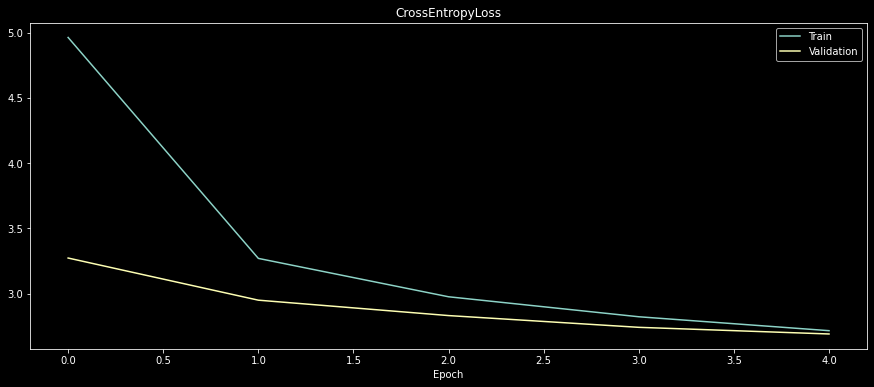

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(train_loss, label='Train')
plt.plot(val_loss, label='Validation')

plt.xlabel('Epoch')
plt.title('CrossEntropyLoss')
plt.legend()
plt.show()

In [ ]:
# сохраним модели
!cp "/content/BEST_baseline.pth" "/content/drive/MyDrive/Diploma_spring/baseline/models/BEST_baseline_mini.pth"
!cp "/content/baseline.pth" "/content/drive/MyDrive/Diploma_spring/baseline/models/baseline_mini.pth"

### Генератор описания

Теперь приступим к тестированию. Подготовим генератор текстового описания. В качестве энкодера возьмем заранее подготовленный на базе `Inception`. Использовать при генерации будем `greedy search`

In [ ]:
DATA_FOLDER = Path("/content/drive/MyDrive/Diploma_spring/baseline")
wordmap_path = DATA_FOLDER / Path("wordmap.json")
with open(wordmap_path, 'r') as j:
    wordmap = json.load(j)

In [ ]:
def generate_caption(image_path, 
                     encoder, 
                     decoder, 
                     wordmap,
                     device, 
                     caption_prefix=wordmap["<SOS>"], 
                     SIZE=299,
                     max_len=120):
  
    vocab_size = len(wordmap)
    decoder = decoder.to(device)
    encoder = encoder.to(device)
    # читаем изображение
    img = plt.imread(image_path)
    img = resize(img, (SIZE, SIZE))
    # проверям, что все каналы на месте
    assert isinstance(img, np.ndarray) and np.max(img) <= 1\
           and np.min(img) >=0 and img.shape[-1] == 3
    img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32)
    img = img.to(device)
    with torch.no_grad():
        decoded_batch = torch.zeros((1, max_len)).to(device)
        vectors_8x8, encoder_out, logits = encoder(img[None])
        # у нас сеть, готовая для attention - поэтому добавим размерности пикселей
        encoder_out = encoder_out.unsqueeze(1)
        # находим размерность выхода энкодера
        encoder_dim = encoder_out.size(-1)
        # flatten-преобразование
        encoder_out = encoder_out.view(1, 1, encoder_dim)
        h, c = decoder.init_hidden_state(encoder_out)
        # первый инпут - <SOS>
        prev_word = torch.LongTensor([[caption_prefix]]).to(device)
        # дальше перебираем метки. На вход декодеру подаем эмбеддинг
        # и выход с предыдущего шага декодера
        for t in range(max_len):

            embeddings = decoder.embedding(prev_word).squeeze(1)
            h, c = decoder.decode_step(
                            embeddings, (h, c),
                        )
            scores = decoder.fc(h)
            scores = F.log_softmax(scores, dim=1) # log_softmax вместо softmax
            # перебираем жадно - берем самое сильное предсказание
            if t == 0:
              top_k_scores, top_k_words = scores[0].topk(1)
              
            else:
              top_k_scores, top_k_words = scores.view(
                      -1).topk(1)
            # добавляем в общий список
            top_k_words = top_k_words.view(-1)
            decoded_batch[:, t] = top_k_words
            # формируем новый инпут для декодера
            prev_word = top_k_words.detach().view(-1, 1)
            if prev_word == wordmap["<EOS>"]:
              break
        return list(map(int, decoded_batch.tolist()[0]))

Основные функции готовы...проведем тестовый прогон на двух подготовленных изображениях

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


### Тестовый инференс

Сначала подгрузим данные и модели, загрузим словари

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# для загрузки с диска
model = "/content/drive/MyDrive/Diploma_spring/baseline/models/BEST_baseline_mini.pth"

# загрузим модели
checkpoint = torch.load(model, map_location=device)
decoder = checkpoint['decoder']
decoder.eval()
encoder = beheaded_inception_v3().train(False)
encoder.eval()
# подготовим словарь idx2word
idx2word = {v: k for k, v in wordmap.items()}

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

In [ ]:
%%capture
# скачиваем изображения, размер 299 на 299 для ресайза
!wget https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg -O img_001.jpg
!wget http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg -O img_002.jpg

In [ ]:
# смотрим первое изображение
img_001 = "/content/img_001.jpg"
best = generate_caption(img_001, encoder, decoder, wordmap, device)

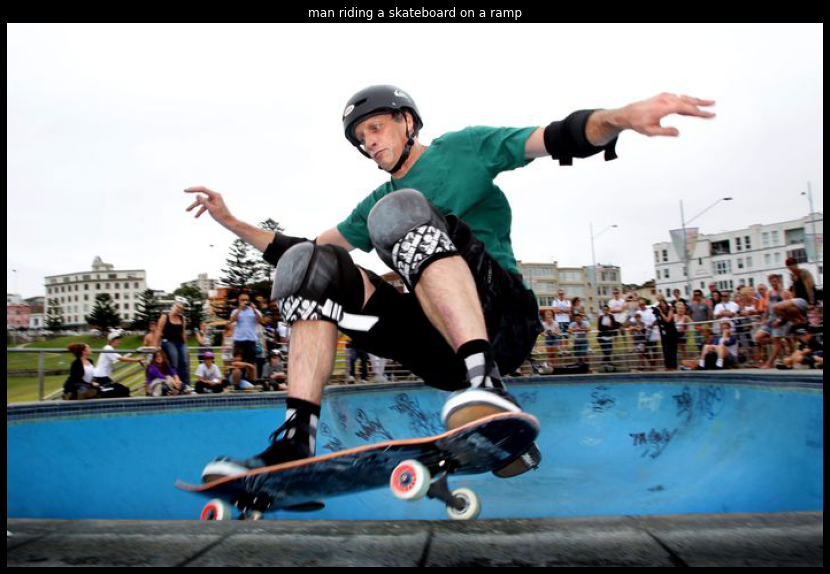

In [ ]:
plt.figure(figsize=(15, 10))
end = findexact(best)
best = best[:end]
words = [idx2word[ind] for ind in best]
title = ' '.join(words[1:-1])
plt.imshow(np.array(Image.open(img_001)))
plt.title(title)
plt.axis("off")
plt.show()

Здесь вышло достаточно неплохо, но скудно, по сравнению с `attention`

In [ ]:
# смотрим второе изображение
img_002 = "/content/img_002.jpg"
best = generate_caption(img_002, encoder, decoder, wordmap, device)

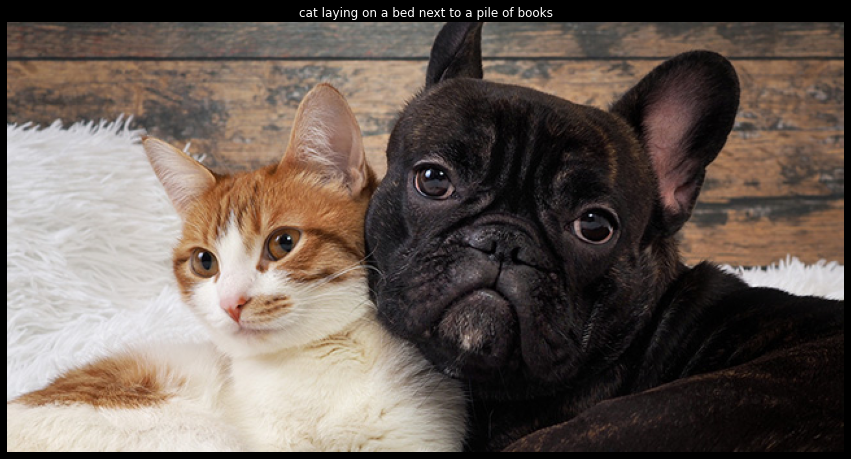

In [ ]:
plt.figure(figsize=(15, 10))
end = findexact(best)
best = best[:end]
words = [idx2word[ind] for ind in best]
title = ' '.join(words[1:-1])
plt.imshow(np.array(Image.open(img_002)))
plt.title(title)
plt.axis("off")
plt.show()

Да, с генерацией здесь плохо, но хотя бы нашли кота

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Применения на разнообразных изображениях


Для запуска необходимо выполниять ячейку с `process()` и загрузить изображение. Для того, чтобы можно было запустить все независимо - сюда перенем загрузки и назначения всех необходимых объектов - в скрипты переносить не будем - скроем все в выпадющем разделе. Для того, чтобы запустить `process` - просто необходимо выполнить ячейки в скрытом разделе, что подгрузит модели. Раздел ниже свернут - если необходимо поработать с инференсом - просто открываем и запускаем ячейки

### Вспомогательные ячейки - запускать, если нужна независимая работа с данным разделом

Здесь соберем необходимые импорты и загрузки весов. В скрипты оборачивать не стал - чтобы было понимание, что в итоге понадобилось для реализации решения для инференса на случайных изображениях

In [ ]:
%%capture
# загрузим энкодер
!gdown --id 1BCHgtAgqYJcyyCf_6Zb8Y9E_p0HbtXuz

In [ ]:
import json
import torch
import random
import io
import os
import warnings
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
import torch.nn as nn
import pandas as pd
import heapq
import ipywidgets as widgets
from pathlib import Path
from PIL import Image
from imageio import imread
import torchvision.transforms as transforms
from skimage.transform import (
    resize,
    pyramid_expand
)
from tqdm.autonotebook import tqdm
from google.colab import drive, files
from glob import glob
import torch.nn.functional as F
from beheaded_inception3 import beheaded_inception_v3 # подготовлено DLS https://www.dlschool.org/

# технические
SEED = random.seed(42)
warnings.filterwarnings("ignore")
plt.style.use('dark_background')

Ниже пойдет декодер, который мы обучали. К нему позже подгрузим веса

In [ ]:
class CaptionNet(nn.Module):

    """
    Apply the network in training mode.
    :param image_vectors: torch tensor, содержащий выходы inseption. Те, из которых будем генерить текст
            shape: [batch, cnn_feature_size]
    :param captions_ix:
            таргет описания картинок в виде матрицы
    :returns: логиты для сгенерированного текста описания, shape: [batch, word_i, n_tokens]

    Обратите внимание, что мы подаем сети на вход сразу все префиксы описания
    и просим ее к каждому префиксу сгенерировать следующее слово!
    """

    def __init__(
        self,
        embed_dim=None,
        decoder_dim=None,
        vocab_size=None,
        encoder_dim=2048,
        dropout=0.5
    ):
        super().__init__()
        # стандартная архитектура такой сети такая:
        # 1. линейные слои для преобразования эмбеддиинга картинки в начальные состояния h0 и c0 LSTM
        # 2. слой эмбедднга
        # 3. LSTM слои
        # 4. линейный слой для получения логитов
        # выходе энкодера (B, 2048)
        self.encoder_dim = encoder_dim
        self.embed_dim = embed_dim
        self.decoder_dim = decoder_dim
        # словарь, подготовленный ранее
        self.vocab_size = vocab_size
        self.dropout = dropout
        # слой эмбеддингов
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.dropout = nn.Dropout(p=self.dropout)
        # ячейка LSTM - всю брать не стал - нам нужно в конкретный момент времени
        # получить конкретный ответ, достаточно взять ячейку показалось
        # так оказалось легче делать beam search
        self.decode_step = nn.LSTMCell(
            embed_dim, decoder_dim, bias=True
        )
        # инициализация hidden
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        # инициализация cell
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.fc = nn.Linear(decoder_dim, vocab_size)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.init_weights()

    def init_hidden_state(self, image_vectors):
        """инициализация весов для cell и hidden"""
        image_vectors = image_vectors.mean(dim=1)
        h = self.init_h(image_vectors)
        c = self.init_c(image_vectors)
        return h, c

    def init_weights(self):
        """иницилиализация весов равномерным распределением для слоя эмбеддингов и fc"""
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, image_vectors, captions_ix, caption_lengths):
        batch_size = image_vectors.size(0)
        encoder_dim = image_vectors.size(-1)
        image_vectors = image_vectors.unsqueeze(1)
        image_vectors = image_vectors.view(batch_size, 1, encoder_dim)
        # сортируем данные по длине, по убыванию - понадобится в будущем
        # мы сможем по длине отсекать ине генерировать лишние последовательности
        # во время обучения
        caption_lengths, sort_idx = caption_lengths.squeeze(1).sort(
            dim=0, descending=True
        )
        image_vectors = image_vectors[sort_idx]
        captions_ix = captions_ix[sort_idx]
        # инициализируем LSTM state
        h, c = self.init_hidden_state(image_vectors)
        # применим слой эмбеддингов к image_vectors
        # (batc, cap_len, embd_dim)
        embeddings = self.dropout(self.embedding(captions_ix))
        # скормим LSTM embeddings
        # при этом не будем передавать <EOS> в декодер
        # мы ранее сохраняли информацию о длине последовательности
        # поэтому фактическая длина будет сохраненная - 1
        decode_lengths = (caption_lengths - 1).tolist()
        # создаем тензор-хранилище
        predictions = torch.zeros(batch_size, max(decode_lengths), self.vocab_size).to(
            self.device
        )
        # перебираем time-stamps
        for t in range(max(decode_lengths)):
            # ограничиваем - мы ранее сортировали, теперь генерируем только там, где необходимо
            # на инференсе шаг будет выполнен иначе - в виде жадного поиска
            batch_size_cap = sum([l > t for l in decode_lengths])
            # на каждом time-stemp мы используем hidden и cell с предыдущего шага
            h, c = self.decode_step(
                embeddings[:batch_size_cap, t, :],
                (h[:batch_size_cap], c[:batch_size_cap]),
            )
            # предсказания каждого шага - логиты
            preds = self.fc(self.dropout(h))
            # добавляем к общему тензору
            predictions[:batch_size_cap, t, :] = preds
        return predictions, captions_ix, decode_lengths, sort_idx


def findexact(lst):
    """дя удаления PAD и EOS"""
    key = [11568, 0, 11385]
    for idx, elem in enumerate(lst):
        if any(item == elem for item in key):
            return idx

In [ ]:
%%capture
# веса модели
!gdown --id 1LSLKrpGS1phODkjED-49KCiZkZ6aPEJO
# путь к словарю
!gdown --id 1dhos5035-CzqD5AlYOIasdzeV7FsYCfB

# грузим словарь
wordmap_path = "/content/wordmap.json"
with open(wordmap_path, 'r') as j:
    wordmap = json.load(j)

Зададим основую функцию для генерации. Здесь применяли жадный алгоритм для тестирования

In [ ]:
def generate_caption(image_path, 
                     encoder, 
                     decoder, 
                     wordmap,
                     device, 
                     caption_prefix=wordmap["<SOS>"], 
                     SIZE=299,
                     max_len=120):
  
    vocab_size = len(wordmap)
    decoder = decoder.to(device)
    encoder = encoder.to(device)
    # читаем изображение
    img = plt.imread(image_path)
    img = resize(img, (SIZE, SIZE))
    # проверям, что все каналы на месте
    assert isinstance(img, np.ndarray) and np.max(img) <= 1\
           and np.min(img) >=0 and img.shape[-1] == 3
    img = torch.tensor(img.transpose([2, 0, 1]), dtype=torch.float32)
    img = img.to(device)
    with torch.no_grad():
        decoded_batch = torch.zeros((1, max_len)).to(device)
        vectors_8x8, encoder_out, logits = encoder(img[None])
        # у нас сеть, готовая для attention - поэтому добавим размерности пикселей
        encoder_out = encoder_out.unsqueeze(1)
        # находим размерность выхода энкодера
        encoder_dim = encoder_out.size(-1)
        # flatten-преобразование
        encoder_out = encoder_out.view(1, 1, encoder_dim)
        h, c = decoder.init_hidden_state(encoder_out)
        # первый инпут - <SOS>
        prev_word = torch.LongTensor([[caption_prefix]]).to(device)
        # дальше перебираем метки. На вход декодеру подаем эмбеддинг
        # и выход с предыдущего шага декодера
        for t in range(max_len):

            embeddings = decoder.embedding(prev_word).squeeze(1)
            h, c = decoder.decode_step(
                            embeddings, (h, c),
                        )
            scores = decoder.fc(h)
            scores = F.log_softmax(scores, dim=1) # log_softmax вместо softmax
            # перебираем жадно - берем самое сильное предсказание
            if t == 0:
              top_k_scores, top_k_words = scores[0].topk(1)
              
            else:
              top_k_scores, top_k_words = scores.view(
                      -1).topk(1)
            # добавляем в общий список
            top_k_words = top_k_words.view(-1)
            decoded_batch[:, t] = top_k_words
            # формируем новый инпут для декодера
            prev_word = top_k_words.detach().view(-1, 1)
            if prev_word == wordmap["<EOS>"]:
              break
        return list(map(int, decoded_batch.tolist()[0]))

### Применение на изображениях

Теперь мы можем посмотреть, как наше решение справляется со случайными изображениями

-----
<font size=2>Если вы хотите поиграть с моделями - запустите ячейки раздела ВСПОМОГАТЕЛЬНЫЕ ЯЧЕЙКИ </font>

In [ ]:
plt.style.use('dark_background')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
wordmap_path = "/content/wordmap.json"
with open(wordmap_path, 'r') as j:
    wordmap = json.load(j)
model = "/content/BEST_baseline_mini.pth"

# загрузим модели
checkpoint = torch.load(model, map_location=device)
decoder = checkpoint['decoder']
decoder.eval()
encoder = beheaded_inception_v3().train(False)
encoder.eval()
# подготовим словарь idx2word
idx2word = {v: k for k, v in wordmap.items()}
# зададим директории входов
input = Path('/content/input')

# для сброса о чистки вывода, после инференса
def reset(p):
  with output_reset:
    clear_output()
  clear_output()
  process()
# кнопки
button_reset = widgets.Button(description="Upload")
output_reset = widgets.Output()
button_reset.on_click(reset)

#основная функция - необходима, для запуска загрузки
def process(upload=True):
  input.mkdir(parents=True, exist_ok=True)
  %cd {input}
  in_files = sorted(glob(f'{input}/*'))
  print('\nНажмите кнопку для загрузки изображения\n')
  if (len(in_files)==0) | (upload):
    # удаляем все что есть внутри
    !rm -rf {input}/*
    uploaded = files.upload()
    if len(uploaded.keys())<=0: 
      print('\nНет файлов для загрузки. Пожалуйста, попробуйте снова...\n')
      return
  # пробегаемся по картинкам и делаем инференс
  in_files = sorted(glob(f'{input}/*'))
  for img in tqdm(in_files):
    best = generate_caption(img, encoder, decoder, wordmap, device)
    plt.figure(figsize=(15, 10))
    end = findexact(best)
    best = best[:end]
    words = [idx2word[ind] for ind in best]
    title = ' '.join(words[1:-1])
    plt.imshow(np.array(Image.open(img)))
    plt.title(title)
    plt.axis("off")
    plt.show()

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

/content/input

Нажмите кнопку для загрузки изображения



Saving 4f063032-7149-4333-a107-2285e4f2ad71.jpg to 4f063032-7149-4333-a107-2285e4f2ad71.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

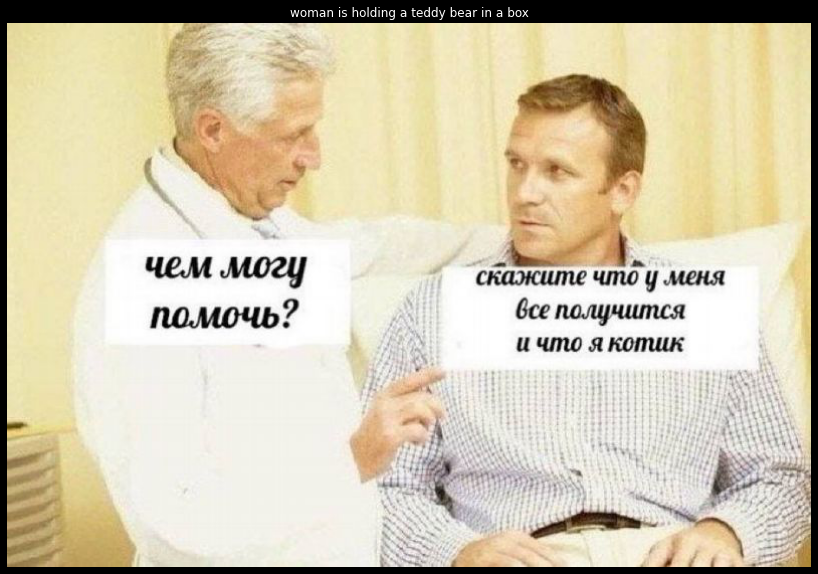

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

В принципе - согласен)) Но в плане качества - хуже гораздо, чем с `attention`. Техника `online learning` помогла улучшить качествао - ранее было гораздо хуже

/content/input

Нажмите кнопку для загрузки изображения



Saving boat.jpg to boat.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

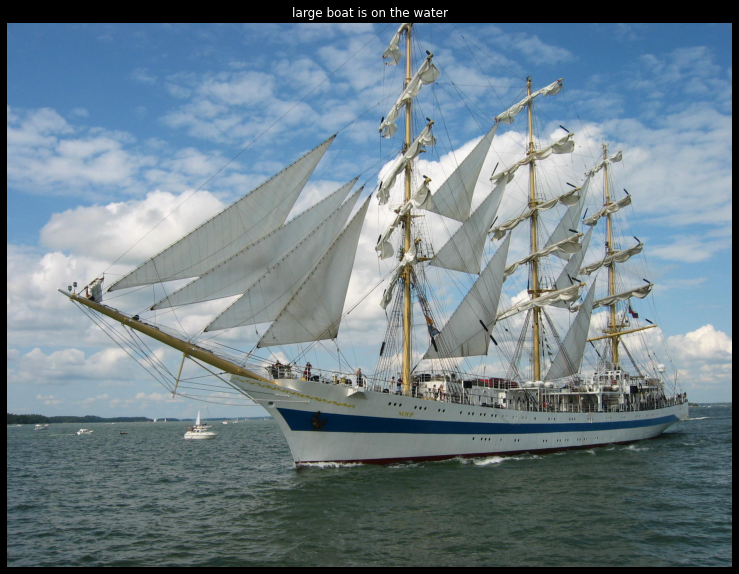

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

Описание достаточно скудное, но верное

/content/input

Нажмите кнопку для загрузки изображения



Saving Superman_and_Batman.jpg to Superman_and_Batman.jpg


  0%|          | 0/1 [00:00<?, ?it/s]

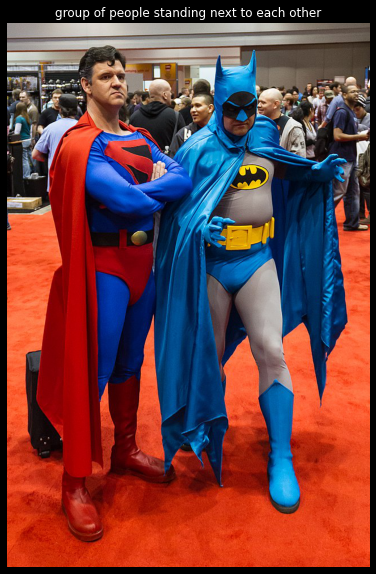

In [ ]:
# выполняем ячейку
# выбираем любую картинку
# выдается текстовое описание и сама картинка
process()

И здесь сложно придраться

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Вывод


Во втором разделе мы работали с базовой архитектурой и не учили энкодер - брали сеть из зоопарка моделей и получали эмбеддинги из нее. `Attention` не применяли. По обучению получили результаты чуть хуже, на инференсе данное решение показывает плохие результаты, переобучается на определенные слова, датасет не сбалансирован. Но в целом - ожидаемо. В качестве улучшения - можно было бы применять `teacher forcing` - мы здесь в обучении ограничивали генерацию заранее заготовленной длиной для каждого описания. Также реализовали генератор описаний на базе жадного алгоритма. Обучали с применением подобия техники `online learning` - большой датасет, мало эпох - помогло улучшить качество генераций. На диске доступны веса с `bleu4 21` - там все переобучается и везде генерит слово `человек`. В итоге, лучшее решение здесь - с `bleu4 19.23`. Генерация в таком варианте - конечно же хуже, чем с `attention`, но в целом приемлемо для такого решения - мы не учили энкодер, мы не использовали `attention`

<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___


# Заключение

Мы поработали над задачей `image captioning` — процесса создания проблемы Sequence to Sequence.

По результатам работы получили  два варианта решения, которые размещены в своих разделах - первый вариант - более сложный - `soft-attention` и обучение своего энкодера с реализацией `beam-search` алгоритма на инференесе. Второй вариант - базовый функционал на основе жадного поиска и генерации текста на основании предыдущего шага декодера

Лучшие результаты, мы получили на основе применения `attention` - Раздел I.  `bleu4 - 23.139`. Больше всего времени ушло на раздел II, чтобы добиться приемлемого качества. Все очень сильно переобучалось, описания генерировались слабые и не очень качественные, при этом метрики были неплохие

В процессе работы, также были разобраны принципы формирования больших датасетов через `h5py`-файлы, и второй подход - формирование на базе `npy` и `json`, что позволяет умещать данные в ограниченные ресурсы

 Все материалы, доступны для скачивания и располагаются на личном хранилище

https://drive.google.com/drive/folders/1KXLDoFR5ZiOkSm5zo6lr5UFSV_lxPH2H?usp=sharing

Ниже, повторно представлены ссылки, которые помогли разобраться в теме

Полезные ссылки и материал, которые использованы в процессе исследования:

https://towardsdatascience.com/a-guide-to-image-captioning-e9fd5517f350  
https://towardsdatascience.com/image-captioning-in-deep-learning-9cd23fb4d8d2  
https://www.hindawi.com/journals/cin/2020/3062706/  
https://www.tensorflow.org/tutorials/text/image_captioning  
http://cs.stanford.edu/people/karpathy/deepimagesent/caption_datasets.zip  
https://towardsdatascience.com/image-captions-with-attention-in-tensorflow-step-by-step-927dad3569fa  
https://arxiv.org/pdf/2110.11773.pdf
https://www.youtube.com/watch?v=AHt6KLqWilI  
https://keras.io/examples/vision/image_captioning/    
https://www.kaggle.com/code/hsankesara/image-captioning/notebook  
https://www.kaggle.com/code/shadabhussain/automated-image-captioning-flickr8  
https://www.kaggle.com/code/kagglethomas88/flickr-image-captioning-tpu-tf2-glove-extended/notebook  
https://www.dlschool.org/  
https://blade6570.github.io/soumyatripathy/hdf5_blog.html  
https://github.com/kelvinxu/arctic-captions/blob/master/alpha_visualization.ipynb  
https://arxiv.org/abs/1606.02960 
https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Image-Captioning  
https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/text/image_captioning.ipynb 
https://github.com/yurayli/image-caption-pytorch/blob/master/model.py  
https://towardsdatascience.com/foundations-of-nlp-explained-visually-beam-search-how-it-works-1586b9849a24  
https://medium.com/@kion.kim/lstm-vs-lstmcell-and-others-on-gluon-aac33f7b54ea#:~:text=LSTMCell%20is%20useful%20when%20we,at%20the%20previous%20time%20step.&text=Due%20to%20this%20difference%2C%20LSTM,for%20information%20about%20time%20step.



<div style="float:left;margin:0 10px 10px 0" markdown="1">
    <a href="#footer"><img src='https://img.shields.io/badge/К содержанию-&#x21A9-blue'></a>
</div>

___
